# Imports

In [135]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import datetime

# For data preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# For classification models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# For regression models
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

# For model evaluation
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import GridSearchCV


In [136]:
def scatter_plots(x_cols, y_col, df):
    num_plots = len(x_cols)
    num_rows = (num_plots + 3) // 4
    fig, axes = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))
    axes = axes.flatten()

    for i, x_col in enumerate(x_cols):
        sns.scatterplot(x=x_col, y=y_col, data=df, ax=axes[i])
        axes[i].set_title(f'{x_col} vs {y_col}')
        axes[i].set_xlabel(x_col)
        axes[i].set_ylabel(y_col)
        axes[i].grid(True)

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

def scatter_plot(x_col, y_col, df):
    plt.figure(figsize=(6, 6))
    sns.scatterplot(x=x_col, y=y_col, data=df)
    plt.title(f'{x_col} vs {y_col}')
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.grid(True)
    plt.show()

def get_null_percentage(column_name, df):
    null_percentage = df[column_name].isnull().sum() / len(df) * 100
    print(f"Null percentage for {column_name}: {null_percentage:.2f}")

def hist_plots(df, cols):
    plt.figure(figsize=(20, 70))
    for i, col in enumerate(cols):
        plt.subplot(25, 5, i + 1)
        sns.histplot(df[col], kde=True)
        plt.xlabel(col)
        plt.title(col)
        plt.grid(True)
        plt.tight_layout()
    plt.show()

def hist_plot(col, df):
    plt.figure(figsize=(6, 6))
    sns.histplot(df[col], kde=True)
    plt.xlabel(col)
    plt.title(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def box_plots(df, cols):
    plt.figure(figsize=(20, 70))
    for i, col in enumerate(cols):
        plt.subplot(25, 5, i + 1)
        sns.boxplot(y=df[col])
        plt.title(col)
        plt.tight_layout()
    plt.show()

def box_plot(col, df):
    plt.figure(figsize=(6, 6))
    sns.boxplot(y=df[col])
    plt.title(col)
    plt.tight_layout()
    plt.show()

In [137]:
regression_models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'Decision Tree Regressor': DecisionTreeRegressor(),
    'Random Forest Regressor': RandomForestRegressor(),
    'Gradient Boosting Regressor': GradientBoostingRegressor(),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(),
    'Support Vector Regressor': SVR()
}

In [138]:
classification_models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Support Vector Machine': SVC()
}

# Analysis

## Actigraphy analysis

In [139]:
source = 'series_train.parquet'

df = pd.read_parquet(source)
display(df)

,step,X,Y,Z,enmo,anglez,non-wear_flag,light,battery_voltage,time_of_day,weekday,quarter,relative_date_PCIAT,id
0,0,0.021536,0.022214,-1.022370,0.022853,-88.280762,0.0,53.000000,4188.000000,56940000000000,4,3,41.0,00115b9f
1,1,0.022005,0.022187,-1.019740,0.020231,-88.241707,0.0,51.666668,4188.166504,56945000000000,4,3,41.0,00115b9f
2,2,0.022240,0.022005,-1.019401,0.019893,-88.170067,0.0,50.333332,4188.333496,56950000000000,4,3,41.0,00115b9f
3,3,0.021589,0.022578,-1.018177,0.018667,-88.250031,0.0,50.500000,4188.500000,56955000000000,4,3,41.0,00115b9f
4,4,0.022005,0.023763,-1.014323,0.016848,-88.130775,0.0,33.166668,4181.000000,57235000000000,4,3,41.0,00115b9f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
314569144,398995,0.234029,-0.009520,0.993087,0.020346,76.694092,0.0,0.000000,3098.833252,52115000000000,3,1,324.0,ffed1dd5
314569145,398996,0.233796,-0.009803,0.993204,0.020409,76.693787,0.0,0.000000,3098.666748,52120000000000,3,1,324.0,ffed1dd5
314569146,398997,0.233900,-0.009610,0.993113,0.020342,76.693100,0.0,0.000000,3098.500000,52125000000000,3,1,324.0,ffed1dd5
314569147,398998,0.234016,-0.009584,0.992762,0.020028,76.693352,0.0,0.000000,3098.333252,52130000000000,3,1,324.0,ffed1dd5


In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 314569149 entries, 0 to 314569148
Data columns (total 14 columns):
 #   Column               Dtype   
---  ------               -----   
 0   step                 uint32  
 1   X                    float32 
 2   Y                    float32 
 3   Z                    float32 
 4   enmo                 float32 
 5   anglez               float32 
 6   non-wear_flag        float32 
 7   light                float32 
 8   battery_voltage      float32 
 9   time_of_day          int64   
 10  weekday              int8    
 11  quarter              int8    
 12  relative_date_PCIAT  float32 
 13  id                   category
dtypes: category(1), float32(9), int64(1), int8(2), uint32(1)
memory usage: 15.2 GB


In [141]:
# There seems to be a lot of entries where the device was not on, but not so many in comparison to the overall number
# We can keep this entry and see if there's a correlation between these values and the SSI

print(df[df['non-wear_flag'] == 0].shape)
print(df[df['non-wear_flag'] == 1].shape)

print(df[df['non-wear_flag'].between(0, 1, inclusive='neither')].shape)

(226122397, 14)
(82524637, 14)
(5922115, 14)


In [142]:
# There are no null values in this dataset, which makes our work a bit easier

for col in df.columns:
    print(col, df[col].isna().sum())

step 0
X 0
Y 0
Z 0
enmo 0
anglez 0
non-wear_flag 0
light 0
battery_voltage 0
time_of_day 0
weekday 0
quarter 0
relative_date_PCIAT 0
id 0


In [143]:
# Convert nanoseconds to seconds and extract hours, minutes, seconds
df['seconds'] = df['time_of_day'].astype(int) / 1e9

# Convert the seconds to time of day using datetime.time
df['time_of_day'] = df['seconds'].apply(lambda x: (datetime.datetime.min + datetime.timedelta(seconds=x)).time())

df = df.drop(columns=['step', 'X', 'Y', 'Z', 'anglez', 'battery_voltage', 'seconds'])

In [144]:
display(df)

,enmo,non-wear_flag,light,time_of_day,weekday,quarter,relative_date_PCIAT,id
0,0.022853,0.0,53.000000,15:49:00,4,3,41.0,00115b9f
1,0.020231,0.0,51.666668,15:49:05,4,3,41.0,00115b9f
2,0.019893,0.0,50.333332,15:49:10,4,3,41.0,00115b9f
3,0.018667,0.0,50.500000,15:49:15,4,3,41.0,00115b9f
4,0.016848,0.0,33.166668,15:53:55,4,3,41.0,00115b9f
...,...,...,...,...,...,...,...,...
314569144,0.020346,0.0,0.000000,14:28:35,3,1,324.0,ffed1dd5
314569145,0.020409,0.0,0.000000,14:28:40,3,1,324.0,ffed1dd5
314569146,0.020342,0.0,0.000000,14:28:45,3,1,324.0,ffed1dd5
314569147,0.020028,0.0,0.000000,14:28:50,3,1,324.0,ffed1dd5


In [145]:
result = df.groupby('id').agg({
    'enmo': ['mean', 'median'],
    'non-wear_flag': ['mean', 'median'],
    'light': ['mean', 'median']
})

result.columns = ['_'.join(col) for col in result.columns]
result.reset_index(inplace=True)

display(result)

/var/folders/zx/vckbd4yn4t7bb1hlf2w83w5c0000gn/T/ipykernel_15303/3491830584.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = df.groupby('id').agg({


,id,enmo_mean,enmo_median,non-wear_flag_mean,non-wear_flag_median,light_mean,light_median
0,00115b9f,0.047388,0.023637,0.000000,0.0,42.296310,6.926828
1,001f3379,0.011926,0.009831,0.655708,1.0,16.771980,0.879005
2,00f332d1,0.030255,0.006382,0.171246,0.0,66.563393,7.172273
3,01085eb3,0.032946,0.008127,0.035210,0.0,17.800735,6.677332
4,012cadd8,0.058280,0.010466,0.000000,0.0,54.893402,7.059160
...,...,...,...,...,...,...,...
991,fe9c71d8,0.043686,0.022665,0.137257,0.0,7.297878,3.500000
992,fecc07d6,0.002962,0.001934,0.939101,1.0,50.648312,1.181806
993,ff18b749,0.053595,0.014763,0.000000,0.0,94.217117,4.000000
994,ffcd4dbd,0.028601,0.008805,0.020323,0.0,22.480034,5.282995


In [146]:
merge_table = pd.read_csv('train.csv')[['id', 'BIA-BIA_Activity_Level_num', 'SDS-SDS_Total_T', 'PCIAT-PCIAT_Total', 'sii']]

new_df = pd.merge(left=result, right=merge_table, how='left', on='id')

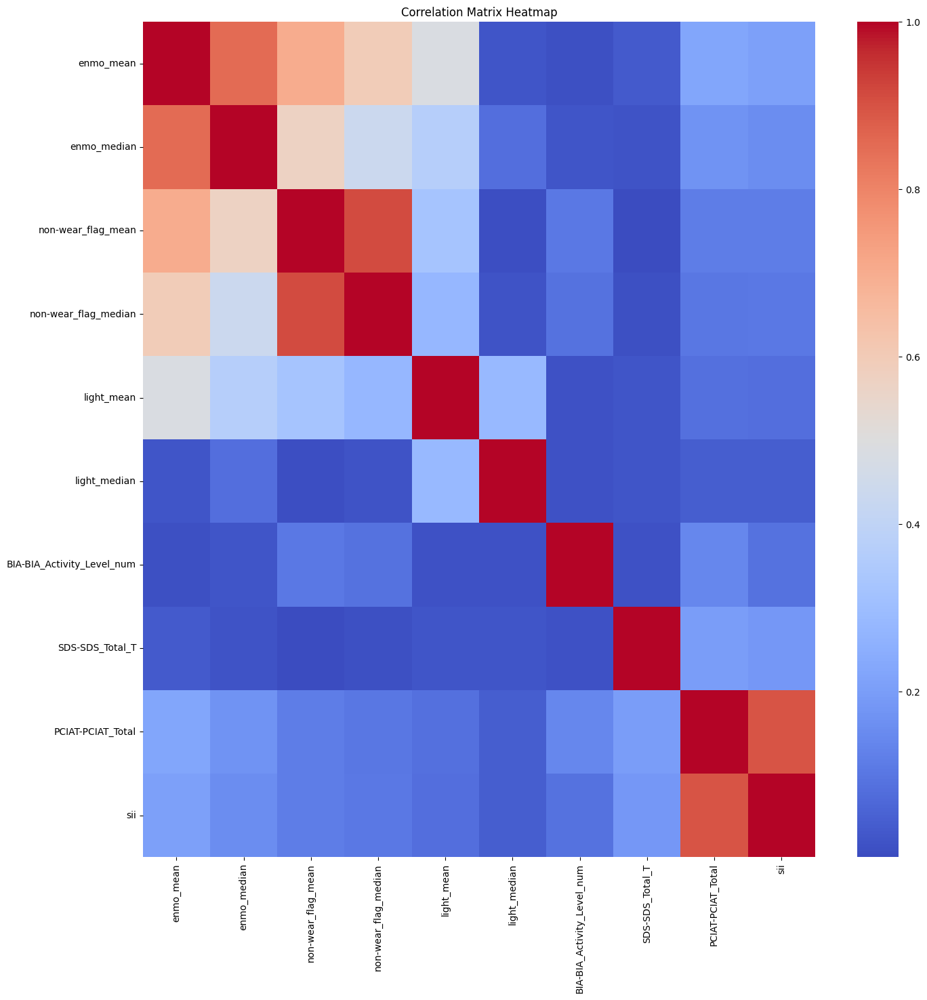

In [147]:
correlation_matrix = new_df.drop(columns=['id']).corr().abs()

plt.figure(figsize=(16, 16))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

In [148]:
# It seems that the amount of movement has a correlation with the value of sii
# Also, the non-wear_flag has a high corelation with enmo,
# which makes sense and it might be unnecessary to have this column

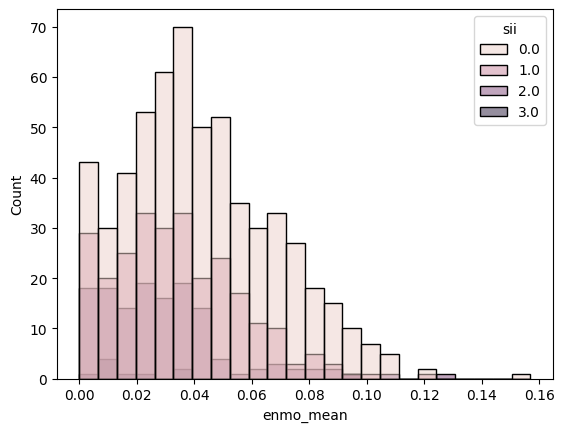

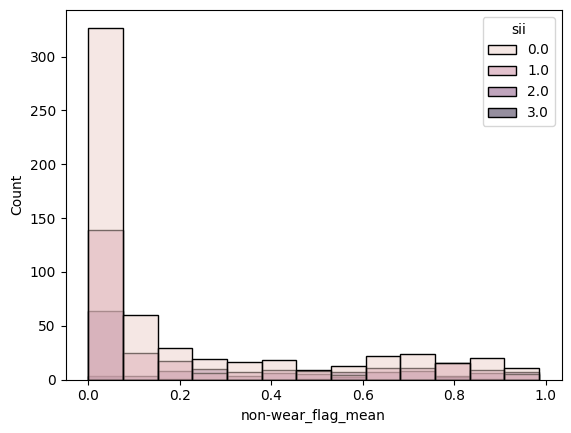

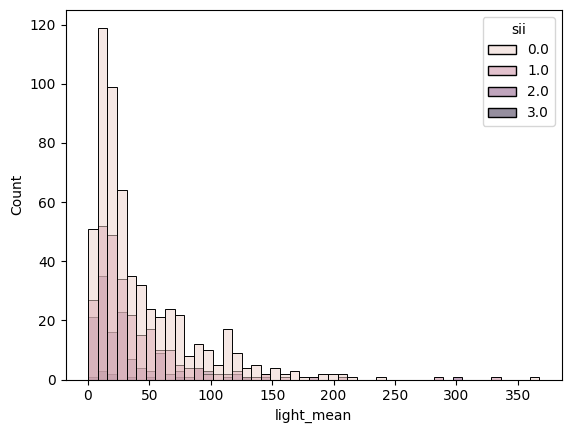

In [149]:
columns_to_display = ['enmo_mean', 'non-wear_flag_mean', 'light_mean']

for col in columns_to_display:
    sns.histplot(new_df, x=col, hue='sii')
    plt.show()

In [150]:
relevant_columns = ['enmo_mean', 'non-wear_flag_mean', 'light_mean']

X = new_df[relevant_columns]

In [151]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_scaled = scaler.fit_transform(X)

pca = PCA(n_components=1)
pca_results = pca.fit_transform(data_scaled)

In [152]:
pca.explained_variance_ratio_

array([0.675017], dtype=float32)

In [153]:
new_df['pca_1'] = pca_results[:, 0]

In [154]:
new_df.drop(columns='id').corr().abs()

,enmo_mean,enmo_median,non-wear_flag_mean,non-wear_flag_median,light_mean,light_median,BIA-BIA_Activity_Level_num,SDS-SDS_Total_T,PCIAT-PCIAT_Total,sii,pca_1
enmo_mean,1.000000,0.854668,0.701932,0.595290,0.485629,0.024358,0.010847,0.035706,0.223629,0.205348,0.908599
enmo_median,0.854668,1.000000,0.570361,0.436308,0.371648,0.080422,0.023182,0.019374,0.172526,0.155682,0.749269
non-wear_flag_mean,0.701932,0.570361,1.000000,0.912742,0.325307,0.009954,0.106387,0.002312,0.116704,0.116949,0.843779
non-wear_flag_median,0.595290,0.436308,0.912742,1.000000,0.277499,0.018094,0.090979,0.011766,0.102887,0.106370,0.743089
light_mean,0.485629,0.371648,0.325307,0.277499,1.000000,0.285997,0.016572,0.022788,0.085371,0.083179,0.698238
light_median,0.024358,0.080422,0.009954,0.018094,0.285997,1.000000,0.014051,0.025123,0.043764,0.041550,0.105393
BIA-BIA_Activity_Level_num,0.010847,0.023182,0.106387,0.090979,0.016572,0.014051,1.000000,0.014004,0.141052,0.089021,0.054552
SDS-SDS_Total_T,0.035706,0.019374,0.002312,0.011766,0.022788,0.025123,0.014004,1.000000,0.197681,0.182497,0.022842
PCIAT-PCIAT_Total,0.223629,0.172526,0.116704,0.102887,0.085371,0.043764,0.141052,0.197681,1.000000,0.894937,0.178401
sii,0.205348,0.155682,0.116949,0.106370,0.083179,0.041550,0.089021,0.182497,0.894937,1.000000,0.169545


## HBN Instruments analysis

In [155]:
train_df = pd.read_csv('train.csv')

### Data overview

In [156]:
display(train_df)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-PCIAT_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,sii
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,...,4.0,2.0,4.0,55.0,NaN,NaN,NaN,Fall,3.0,2.0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,...,0.0,0.0,0.0,0.0,Fall,46.0,64.0,Summer,0.0,0.0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,...,2.0,1.0,1.0,28.0,Fall,38.0,54.0,Summer,2.0,0.0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,...,3.0,4.0,1.0,44.0,Summer,31.0,45.0,Winter,0.0,1.0
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3955,ff8a2de4,Fall,13,0,Spring,60.0,Fall,16.362460,59.5,82.4,...,1.0,1.0,0.0,32.0,Winter,35.0,50.0,Fall,1.0,1.0
3956,ffa9794a,Winter,10,0,NaN,NaN,Spring,18.764678,53.5,76.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Winter,0.0,NaN
3957,ffcd4dbd,Fall,11,0,Spring,68.0,Winter,21.441500,60.0,109.8,...,1.0,0.0,1.0,31.0,Winter,56.0,77.0,Fall,0.0,1.0
3958,ffed1dd5,Spring,13,0,Spring,70.0,Winter,12.235895,70.7,87.0,...,1.0,1.0,1.0,19.0,Spring,33.0,47.0,Spring,1.0,0.0


In [157]:
display(train_df.columns)

Index(['id', 'Basic_Demos-Enroll_Season', 'Basic_Demos-Age', 'Basic_Demos-Sex',
       'CGAS-Season', 'CGAS-CGAS_Score', 'Physical-Season', 'Physical-BMI',
       'Physical-Height', 'Physical-Weight', 'Physical-Waist_Circumference',
       'Physical-Diastolic_BP', 'Physical-HeartRate', 'Physical-Systolic_BP',
       'Fitness_Endurance-Season', 'Fitness_Endurance-Max_Stage',
       'Fitness_Endurance-Time_Mins', 'Fitness_Endurance-Time_Sec',
       'FGC-Season', 'FGC-FGC_CU', 'FGC-FGC_CU_Zone', 'FGC-FGC_GSND',
       'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD', 'FGC-FGC_GSD_Zone', 'FGC-FGC_PU',
       'FGC-FGC_PU_Zone', 'FGC-FGC_SRL', 'FGC-FGC_SRL_Zone', 'FGC-FGC_SRR',
       'FGC-FGC_SRR_Zone', 'FGC-FGC_TL', 'FGC-FGC_TL_Zone', 'BIA-Season',
       'BIA-BIA_Activity_Level_num', 'BIA-BIA_BMC', 'BIA-BIA_BMI',
       'BIA-BIA_BMR', 'BIA-BIA_DEE', 'BIA-BIA_ECW', 'BIA-BIA_FFM',
       'BIA-BIA_FFMI', 'BIA-BIA_FMI', 'BIA-BIA_Fat', 'BIA-BIA_Frame_num',
       'BIA-BIA_ICW', 'BIA-BIA_LDM', 'BIA-BIA_LST'

In [158]:
for col in train_df.columns:
    get_null_percentage(col, train_df)

Null percentage for id: 0.00
Null percentage for Basic_Demos-Enroll_Season: 0.00
Null percentage for Basic_Demos-Age: 0.00
Null percentage for Basic_Demos-Sex: 0.00
Null percentage for CGAS-Season: 35.48
Null percentage for CGAS-CGAS_Score: 38.86
Null percentage for Physical-Season: 16.41
Null percentage for Physical-BMI: 23.69
Null percentage for Physical-Height: 23.56
Null percentage for Physical-Weight: 22.32
Null percentage for Physical-Waist_Circumference: 77.32
Null percentage for Physical-Diastolic_BP: 25.40
Null percentage for Physical-HeartRate: 25.08
Null percentage for Physical-Systolic_BP: 25.40
Null percentage for Fitness_Endurance-Season: 66.97
Null percentage for Fitness_Endurance-Max_Stage: 81.24
Null percentage for Fitness_Endurance-Time_Mins: 81.31
Null percentage for Fitness_Endurance-Time_Sec: 81.31
Null percentage for FGC-Season: 15.51
Null percentage for FGC-FGC_CU: 41.36
Null percentage for FGC-FGC_CU_Zone: 42.37
Null percentage for FGC-FGC_GSND: 72.88
Null perce

### Changing seasons to numerical values

In [159]:
# Converting seasons to numeric values
season_mapping = {'Spring': 0, 'Summer': 1, 'Fall': 2, 'Winter': 3}
season_cols = train_df.filter(regex='Season$').columns
train_df[season_cols] = train_df[season_cols].replace(season_mapping)

/var/folders/zx/vckbd4yn4t7bb1hlf2w83w5c0000gn/T/ipykernel_15303/3507302277.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_df[season_cols] = train_df[season_cols].replace(season_mapping)


### Check valid ranges

First we have to make sure that all of the data is in valid ranges. Some are harder to determin, as ofr example, BMI can be a large number, but in that case it is an outlier in the data.

In [160]:
basic_demos_df = train_df.filter(regex='^Basic_Demos')
cgas_df = train_df.filter(regex='^CGAS')
physical_df = train_df.filter(regex='^Physical')
fitness_df = train_df.filter(regex='^Fitness')
fgc_df = train_df.filter(regex='^FGC')
bia_df = train_df.filter(regex='^BIA')
paq_df = train_df.filter(regex='^PAQ')
pciat_df = train_df.filter(regex='^PCIA')
sds_df = train_df.filter(regex='^SDS')
preint_df = train_df.filter(regex='^PreInt')

In [161]:
display(basic_demos_df.describe().T)
display(cgas_df.describe().T)
display(physical_df.describe().T)
display(fitness_df.describe().T)
display(fgc_df.describe().T)
display(bia_df.describe().T)
display(paq_df.describe().T)
display(pciat_df.describe().T)
display(sds_df.describe().T)
display(preint_df.describe().T)

,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Enroll_Season,3960.0,1.437626,1.148551,0.0,0.0,1.0,3.0,3.0
Basic_Demos-Age,3960.0,10.433586,3.574648,5.0,8.0,10.0,13.0,22.0
Basic_Demos-Sex,3960.0,0.372727,0.483591,0.0,0.0,0.0,1.0,1.0


,count,mean,std,min,25%,50%,75%,max
CGAS-Season,2555.0,1.419569,1.110606,0.0,0.0,1.0,2.0,3.0
CGAS-CGAS_Score,2421.0,65.454771,22.341862,25.0,59.0,65.0,75.0,999.0


,count,mean,std,min,25%,50%,75%,max
Physical-Season,3310.0,1.442598,1.137641,0.0,0.00000,1.000000,2.000000,3.000000
Physical-BMI,3022.0,19.331929,5.113934,0.0,15.86935,17.937682,21.571244,59.132048
Physical-Height,3027.0,55.946713,7.473764,33.0,50.00000,55.000000,62.000000,78.500000
Physical-Weight,3076.0,89.038615,44.569040,0.0,57.20000,77.000000,113.800000,315.000000
Physical-Waist_Circumference,898.0,27.278508,5.567287,18.0,23.00000,26.000000,30.000000,50.000000
Physical-Diastolic_BP,2954.0,69.648951,13.611226,0.0,61.00000,68.000000,76.000000,179.000000
Physical-HeartRate,2967.0,81.597236,13.665196,27.0,72.00000,81.000000,90.500000,138.000000
Physical-Systolic_BP,2954.0,116.983074,17.061225,0.0,107.00000,114.000000,125.000000,203.000000


,count,mean,std,min,25%,50%,75%,max
Fitness_Endurance-Season,1308.0,1.476300,1.164465,0.0,0.00,2.0,3.0,3.0
Fitness_Endurance-Max_Stage,743.0,4.989233,2.014072,0.0,4.00,5.0,6.0,28.0
Fitness_Endurance-Time_Mins,740.0,7.370270,3.189662,0.0,6.00,7.0,9.0,20.0
Fitness_Endurance-Time_Sec,740.0,27.581081,17.707751,0.0,12.75,28.0,43.0,59.0


,count,mean,std,min,25%,50%,75%,max
FGC-Season,3346.0,1.377167,1.129045,0.0,0.0,1.00,2.000,3.0
FGC-FGC_CU,2322.0,11.259690,11.807781,0.0,3.0,9.00,15.750,115.0
FGC-FGC_CU_Zone,2282.0,0.476337,0.499549,0.0,0.0,0.00,1.000,1.0
FGC-FGC_GSND,1074.0,22.420438,10.833995,0.0,15.1,20.05,26.600,124.0
FGC-FGC_GSND_Zone,1062.0,1.829567,0.612585,1.0,1.0,2.00,2.000,3.0
FGC-FGC_GSD,1074.0,23.518622,11.148951,0.0,16.2,21.20,28.175,123.8
FGC-FGC_GSD_Zone,1063.0,1.904045,0.612344,1.0,2.0,2.00,2.000,3.0
FGC-FGC_PU,2310.0,5.579654,7.390161,0.0,0.0,3.00,9.000,51.0
FGC-FGC_PU_Zone,2271.0,0.330251,0.470407,0.0,0.0,0.00,1.000,1.0
FGC-FGC_SRL,2305.0,8.694924,3.429301,0.0,7.0,9.00,11.000,21.7


,count,mean,std,min,25%,50%,75%,max
BIA-Season,2145.0,1.394406,1.042549,0.000000,1.000000,1.00000,2.000000,3.0000
BIA-BIA_Activity_Level_num,1991.0,2.651431,1.028267,1.000000,2.000000,3.00000,3.000000,5.0000
BIA-BIA_BMC,1991.0,6.719826,92.586325,-7.789610,2.966905,3.92272,5.460925,4115.3600
BIA-BIA_BMI,1991.0,19.367048,5.047848,0.048267,15.913600,17.96650,21.461100,53.9243
BIA-BIA_BMR,1991.0,1237.018187,1872.383246,813.397000,1004.710000,1115.38000,1310.360000,83152.2000
BIA-BIA_DEE,1991.0,2064.693747,2836.246272,1073.450000,1605.785000,1863.98000,2218.145000,124728.0000
BIA-BIA_ECW,1991.0,20.825346,73.266287,1.789450,11.109550,15.92800,25.162200,3233.0000
BIA-BIA_FFM,1991.0,74.021708,199.433753,28.900400,49.278100,61.06620,81.833800,8799.0800
BIA-BIA_FFMI,1991.0,15.030554,5.792505,7.864850,13.408000,14.09250,15.430950,217.7710
BIA-BIA_FMI,1991.0,4.336495,6.356402,-194.163000,2.306915,3.69863,5.987690,28.2515


,count,mean,std,min,25%,50%,75%,max
PAQ_A-Season,475.0,1.524211,1.160597,0.00,0.00,1.00,3.00,3.00
PAQ_A-PAQ_A_Total,475.0,2.178853,0.849476,0.66,1.49,2.01,2.78,4.71
PAQ_C-Season,1721.0,1.457873,1.176118,0.00,0.00,1.00,3.00,3.00
PAQ_C-PAQ_C_Total,1721.0,2.589550,0.783937,0.58,2.02,2.54,3.16,4.79


,count,mean,std,min,25%,50%,75%,max
PCIAT-Season,2736.0,1.438962,1.130240,0.0,0.0,1.0,2.0,3.0
PCIAT-PCIAT_01,2733.0,2.370655,1.673312,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_02,2734.0,2.177762,1.697117,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_03,2731.0,2.399854,1.588807,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_04,2731.0,0.839253,1.195601,0.0,0.0,0.0,1.0,5.0
PCIAT-PCIAT_05,2729.0,2.297545,1.705218,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_06,2732.0,1.063690,1.268282,0.0,0.0,1.0,2.0,5.0
PCIAT-PCIAT_07,2729.0,0.586295,1.049355,0.0,0.0,0.0,1.0,5.0
PCIAT-PCIAT_08,2730.0,1.246520,1.342582,0.0,0.0,1.0,2.0,5.0
PCIAT-PCIAT_09,2730.0,1.062637,1.258797,0.0,0.0,1.0,2.0,5.0


,count,mean,std,min,25%,50%,75%,max
SDS-Season,2618.0,1.462567,1.136270,0.0,0.0,1.0,2.0,3.0
SDS-SDS_Total_Raw,2609.0,41.088923,10.427433,17.0,33.0,39.0,46.0,96.0
SDS-SDS_Total_T,2606.0,57.763622,13.196091,38.0,47.0,55.0,64.0,100.0


,count,mean,std,min,25%,50%,75%,max
PreInt_EduHx-Season,3540.0,1.467514,1.147902,0.0,0.0,1.0,3.0,3.0
PreInt_EduHx-computerinternet_hoursday,3301.0,1.060588,1.094875,0.0,0.0,1.0,2.0,3.0


In [162]:
valid_ranges = {
    'Basic_Demos-Enroll_Season': (0, 3),
    'Basic_Demos-Age': (0, 120),
    'Basic_Demos-Sex': (0, 1),
    'CGAS-Season': (0, 3),
    'CGAS-CGAS_Score': (0, 100),
    'Physical-Season': (0, 3),
    'Physical-BMI': (5, 60),
    'Physical-Height': (30, 250),
    'Physical-Weight': (2, 300),
    'Physical-Waist_Circumference': (10, 200),
    'Physical-Diastolic_BP': (30, 120),
    'Physical-HeartRate': (30, 200),
    'Physical-Systolic_BP': (50, 250),
    'Fitness_Endurance-Season': (0, 3),
    'Fitness_Endurance-Max_Stage': (0, 20),
    'Fitness_Endurance-Time_Mins': (0, 60),
    'Fitness_Endurance-Time_Sec': (0, 60),
    'FGC-Season': (0, 3),
    'FGC-FGC_CU': (0, 100),
    'FGC-FGC_CU_Zone': (0, 3),
    'FGC-FGC_GSND': (0, 100),
    'FGC-FGC_GSND_Zone': (0, 3),
    'FGC-FGC_GSD': (0, 100),
    'FGC-FGC_GSD_Zone': (0, 3),
    'FGC-FGC_PU': (0, 100),
    'FGC-FGC_PU_Zone': (0, 3),
    'FGC-FGC_SRL': (0, 100),
    'FGC-FGC_SRL_Zone': (0, 3),
    'FGC-FGC_SRR': (0, 100),
    'FGC-FGC_SRR_Zone': (0, 3),
    'FGC-FGC_TL': (0, 100),
    'FGC-FGC_TL_Zone': (0, 3),
    'BIA-Season': (0, 3),
    'BIA-BIA_Activity_Level_num': (0, 5),
    'BIA-BIA_BMC': (0, 10),
    'BIA-BIA_BMI': (10, 60),
    'BIA-BIA_BMR': (500, 3000),
    'BIA-BIA_DEE': (1000, 5000),
    'BIA-BIA_ECW': (0, 50),
    'BIA-BIA_FFM': (0, 100),
    'BIA-BIA_FFMI': (0, 50),
    'BIA-BIA_FMI': (0, 50),
    'BIA-BIA_Fat': (0, 100),
    'BIA-BIA_Frame_num': (0, 5),
    'BIA-BIA_ICW': (0, 50),
    'BIA-BIA_LDM': (0, 50),
    'BIA-BIA_LST': (0, 100),
    'BIA-BIA_SMM': (0, 100),
    'BIA-BIA_TBW': (0, 100),
    'PAQ_A-Season': (0, 3),
    'PAQ_A-PAQ_A_Total': (0, 10),
    'PAQ_C-Season': (0, 3),
    'PAQ_C-PAQ_C_Total': (0, 10),
    'PCIAT-Season': (0, 3),
    'PCIAT-PCIAT_01': (0, 5),
    'PCIAT-PCIAT_02': (0, 5),
    'PCIAT-PCIAT_03': (0, 5),
    'PCIAT-PCIAT_04': (0, 5),
    'PCIAT-PCIAT_05': (0, 5),
    'PCIAT-PCIAT_06': (0, 5),
    'PCIAT-PCIAT_07': (0, 5),
    'PCIAT-PCIAT_08': (0, 5),
    'PCIAT-PCIAT_09': (0, 5),
    'PCIAT-PCIAT_10': (0, 5),
    'PCIAT-PCIAT_11': (0, 5),
    'PCIAT-PCIAT_12': (0, 5),
    'PCIAT-PCIAT_13': (0, 5),
    'PCIAT-PCIAT_14': (0, 5),
    'PCIAT-PCIAT_15': (0, 5),
    'PCIAT-PCIAT_16': (0, 5),
    'PCIAT-PCIAT_17': (0, 5),
    'PCIAT-PCIAT_18': (0, 5),
    'PCIAT-PCIAT_19': (0, 5),
    'PCIAT-PCIAT_20': (0, 5),
    'PCIAT-PCIAT_Total': (0, 100),
    'SDS-Season': (0, 3),
    'SDS-SDS_Total_Raw': (0, 100),
    'SDS-SDS_Total_T': (0, 100),
    'PreInt_EduHx-Season': (0, 3),
    'PreInt_EduHx-computerinternet_hoursday': (0, 24),
    'sii': (0, 3)
}

for column, (min_val, max_val) in valid_ranges.items():
    train_df.loc[(train_df[column] < min_val) | (train_df[column] > max_val), column] = np.nan

In [163]:
basic_demos_df = train_df.filter(regex='^Basic_Demos')
cgas_df = train_df.filter(regex='^CGAS')
physical_df = train_df.filter(regex='^Physical')
fitness_df = train_df.filter(regex='^Fitness')
fgc_df = train_df.filter(regex='^FGC')
bia_df = train_df.filter(regex='^BIA')
paq_df = train_df.filter(regex='^PAQ')
pciat_df = train_df.filter(regex='^PCIA')
sds_df = train_df.filter(regex='^SDS')
preint_df = train_df.filter(regex='^PreInt')

In [164]:
display(basic_demos_df.describe().T)
display(cgas_df.describe().T)
display(physical_df.describe().T)
display(fitness_df.describe().T)
display(fgc_df.describe().T)
display(bia_df.describe().T)
display(paq_df.describe().T)
display(pciat_df.describe().T)
display(sds_df.describe().T)
display(preint_df.describe().T)

,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Enroll_Season,3960.0,1.437626,1.148551,0.0,0.0,1.0,3.0,3.0
Basic_Demos-Age,3960.0,10.433586,3.574648,5.0,8.0,10.0,13.0,22.0
Basic_Demos-Sex,3960.0,0.372727,0.483591,0.0,0.0,0.0,1.0,1.0


,count,mean,std,min,25%,50%,75%,max
CGAS-Season,2555.0,1.419569,1.110606,0.0,0.0,1.0,2.0,3.0
CGAS-CGAS_Score,2420.0,65.069008,11.787310,25.0,59.0,65.0,75.0,95.0


,count,mean,std,min,25%,50%,75%,max
Physical-Season,3310.0,1.442598,1.137641,0.000000,0.000000,1.000000,2.000000,3.000000
Physical-BMI,3015.0,19.376812,5.034191,8.522436,15.890526,17.950925,21.588631,59.132048
Physical-Height,3027.0,55.946713,7.473764,33.000000,50.000000,55.000000,62.000000,78.500000
Physical-Weight,3012.0,90.623831,42.634829,31.800000,58.200000,77.800000,114.200000,299.600000
Physical-Waist_Circumference,898.0,27.278508,5.567287,18.000000,23.000000,26.000000,30.000000,50.000000
Physical-Diastolic_BP,2932.0,69.369372,12.501231,32.000000,61.000000,68.000000,76.000000,120.000000
Physical-HeartRate,2966.0,81.615644,13.630660,33.000000,72.000000,81.000000,90.750000,138.000000
Physical-Systolic_BP,2952.0,117.045732,16.884169,57.000000,107.000000,114.000000,125.000000,203.000000


,count,mean,std,min,25%,50%,75%,max
Fitness_Endurance-Season,1308.0,1.476300,1.164465,0.0,0.00,2.0,3.0,3.0
Fitness_Endurance-Max_Stage,741.0,4.929825,1.658863,0.0,4.00,5.0,6.0,12.0
Fitness_Endurance-Time_Mins,740.0,7.370270,3.189662,0.0,6.00,7.0,9.0,20.0
Fitness_Endurance-Time_Sec,740.0,27.581081,17.707751,0.0,12.75,28.0,43.0,59.0


,count,mean,std,min,25%,50%,75%,max
FGC-Season,3346.0,1.377167,1.129045,0.0,0.000,1.00,2.0,3.0
FGC-FGC_CU,2321.0,11.214994,11.612191,0.0,3.000,9.00,15.0,100.0
FGC-FGC_CU_Zone,2282.0,0.476337,0.499549,0.0,0.000,0.00,1.0,1.0
FGC-FGC_GSND,1072.0,22.247341,10.067038,0.0,15.100,20.00,26.6,81.8
FGC-FGC_GSND_Zone,1062.0,1.829567,0.612585,1.0,1.000,2.00,2.0,3.0
FGC-FGC_GSD,1072.0,23.348134,10.428820,0.0,16.175,21.15,28.1,88.8
FGC-FGC_GSD_Zone,1063.0,1.904045,0.612344,1.0,2.000,2.00,2.0,3.0
FGC-FGC_PU,2310.0,5.579654,7.390161,0.0,0.000,3.00,9.0,51.0
FGC-FGC_PU_Zone,2271.0,0.330251,0.470407,0.0,0.000,0.00,1.0,1.0
FGC-FGC_SRL,2305.0,8.694924,3.429301,0.0,7.000,9.00,11.0,21.7


,count,mean,std,min,25%,50%,75%,max
BIA-Season,2145.0,1.394406,1.042549,0.000000,1.000000,1.00000,2.000000,3.00000
BIA-BIA_Activity_Level_num,1991.0,2.651431,1.028267,1.000000,2.000000,3.00000,3.000000,5.00000
BIA-BIA_BMC,1903.0,4.320603,1.830850,0.009889,2.980525,3.88424,5.313895,9.94457
BIA-BIA_BMI,1990.0,19.376756,5.030492,10.676600,15.913900,17.97070,21.461750,53.92430
BIA-BIA_BMR,1982.0,1182.865994,247.087482,813.397000,1004.310000,1114.95000,1308.222500,2572.41000
BIA-BIA_DEE,1980.0,1976.919773,534.042632,1073.450000,1603.382500,1858.03000,2212.020000,4632.30000
BIA-BIA_ECW,1962.0,18.392499,9.500544,1.789450,11.053725,15.70940,24.582300,49.68530
BIA-BIA_FFM,1743.0,60.862303,16.567056,28.900400,48.018000,57.26720,72.594700,99.93380
BIA-BIA_FFMI,1984.0,14.783064,2.372141,7.864850,13.406175,14.09000,15.420025,46.18490
BIA-BIA_FMI,1956.0,4.700203,3.414898,0.066924,2.368245,3.74524,6.038625,28.25150


,count,mean,std,min,25%,50%,75%,max
PAQ_A-Season,475.0,1.524211,1.160597,0.00,0.00,1.00,3.00,3.00
PAQ_A-PAQ_A_Total,475.0,2.178853,0.849476,0.66,1.49,2.01,2.78,4.71
PAQ_C-Season,1721.0,1.457873,1.176118,0.00,0.00,1.00,3.00,3.00
PAQ_C-PAQ_C_Total,1721.0,2.589550,0.783937,0.58,2.02,2.54,3.16,4.79


,count,mean,std,min,25%,50%,75%,max
PCIAT-Season,2736.0,1.438962,1.130240,0.0,0.0,1.0,2.0,3.0
PCIAT-PCIAT_01,2733.0,2.370655,1.673312,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_02,2734.0,2.177762,1.697117,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_03,2731.0,2.399854,1.588807,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_04,2731.0,0.839253,1.195601,0.0,0.0,0.0,1.0,5.0
PCIAT-PCIAT_05,2729.0,2.297545,1.705218,0.0,1.0,2.0,4.0,5.0
PCIAT-PCIAT_06,2732.0,1.063690,1.268282,0.0,0.0,1.0,2.0,5.0
PCIAT-PCIAT_07,2729.0,0.586295,1.049355,0.0,0.0,0.0,1.0,5.0
PCIAT-PCIAT_08,2730.0,1.246520,1.342582,0.0,0.0,1.0,2.0,5.0
PCIAT-PCIAT_09,2730.0,1.062637,1.258797,0.0,0.0,1.0,2.0,5.0


,count,mean,std,min,25%,50%,75%,max
SDS-Season,2618.0,1.462567,1.136270,0.0,0.0,1.0,2.0,3.0
SDS-SDS_Total_Raw,2609.0,41.088923,10.427433,17.0,33.0,39.0,46.0,96.0
SDS-SDS_Total_T,2606.0,57.763622,13.196091,38.0,47.0,55.0,64.0,100.0


,count,mean,std,min,25%,50%,75%,max
PreInt_EduHx-Season,3540.0,1.467514,1.147902,0.0,0.0,1.0,3.0,3.0
PreInt_EduHx-computerinternet_hoursday,3301.0,1.060588,1.094875,0.0,0.0,1.0,2.0,3.0


### Pre pre-processing correlation

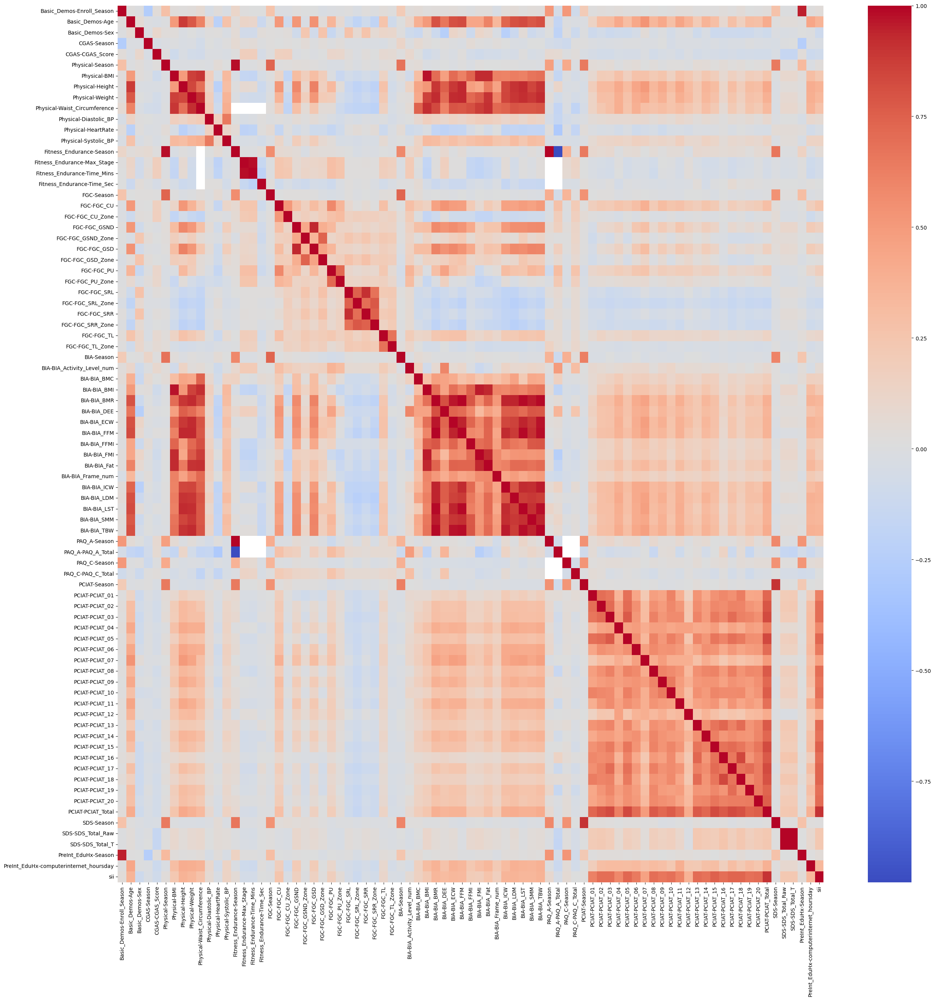

In [165]:
temp = train_df.copy()
temp.drop(['id'], axis=1, inplace=True)
correlation_matrix = temp.corr()
plt.figure(figsize=(30, 30))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.show()

Based on the correlation before processing data we can see few things. We can see correlation with the PCIAT questions, which are the ones that determin sii index. As of now, we have more of interest at columns that have correlation with PSIAT questions. After trying to cleanup the data more, we can see how this change. If it does not change, then we will choose those columns for the model.

### Age group setup

In [166]:
age_groups = sorted(train_df['Basic_Demos-Age'].unique().tolist())
age_groups

[5.0,
 6.0,
 7.0,
 8.0,
 9.0,
 10.0,
 11.0,
 12.0,
 13.0,
 14.0,
 15.0,
 16.0,
 17.0,
 18.0,
 19.0,
 20.0,
 21.0,
 22.0]

### BMI calculations
Columns to drop from this section: Physical-Weight, Physical-Height

Column changes: log on Physical-BMI

In [167]:
get_null_percentage('BIA-BIA_BMI', train_df)
get_null_percentage('Physical-BMI', train_df)

Null percentage for BIA-BIA_BMI: 49.75
Null percentage for Physical-BMI: 23.86


In [168]:
# We will see what are the average difference between BIA-BIA_BMI and Physical-BMI and possibly use one of them to fill the missing values in the other column
valid_rows = train_df.dropna(subset=['BIA-BIA_BMI', 'Physical-BMI'])
difference = valid_rows['BIA-BIA_BMI'] - valid_rows['Physical-BMI']
average_difference = difference.mean()

print(f"Average difference: {average_difference}")

Average difference: 0.016872357077664935


In [169]:
train_df['Physical-BMI'] = train_df['Physical-BMI'].fillna(train_df['BIA-BIA_BMI'])

In [170]:
get_null_percentage('Physical-BMI', train_df)

Null percentage for Physical-BMI: 23.36


In [171]:
# That did not make a huge difference so we will drop one of the columns and will the value in a different way
train_df.drop(columns=['BIA-BIA_BMI'], inplace=True)

In [172]:
groups = train_df.groupby('Basic_Demos-Age')['Physical-BMI']
display(groups.describe())
display(groups.median())

,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,104.0,16.751048,2.788413,12.853139,14.971227,16.305306,17.434099,26.512004
6.0,291.0,16.548862,2.772286,9.959167,14.939428,15.894786,17.137351,34.055363
7.0,328.0,16.816860,3.233151,9.693766,15.016065,16.117365,17.582030,43.468833
8.0,382.0,17.771929,3.909034,8.522436,15.459682,16.899486,19.127038,59.132048
9.0,362.0,17.867989,3.483511,11.925153,15.468905,17.068467,19.264408,33.729946
10.0,331.0,18.885776,4.333376,11.675843,15.720648,17.718711,20.829630,44.554097
11.0,230.0,19.833826,4.590877,11.915254,16.673250,18.713718,22.337504,37.484035
12.0,232.0,20.674940,4.828920,14.223937,17.128041,19.496087,23.458522,40.399621
13.0,180.0,21.299579,4.616201,12.235895,18.140295,20.222764,23.654916,39.494148


Basic_Demos-Age
5.0     16.305306
6.0     15.894786
7.0     16.117365
8.0     16.899486
9.0     17.068467
10.0    17.718711
11.0    18.713718
12.0    19.496087
13.0    20.222764
14.0    20.400500
15.0    21.750668
16.0    22.918610
17.0    22.293470
18.0    22.488082
19.0    24.568841
20.0    26.444712
21.0    23.717292
22.0    25.446171
Name: Physical-BMI, dtype: float64

Seeing that the BMI goes up based on the age group, filling null values should happen based on the age groups median value. Using the mean value would count in also the possible outliers with high or low BMI's in that age group.

Age group: 5.0


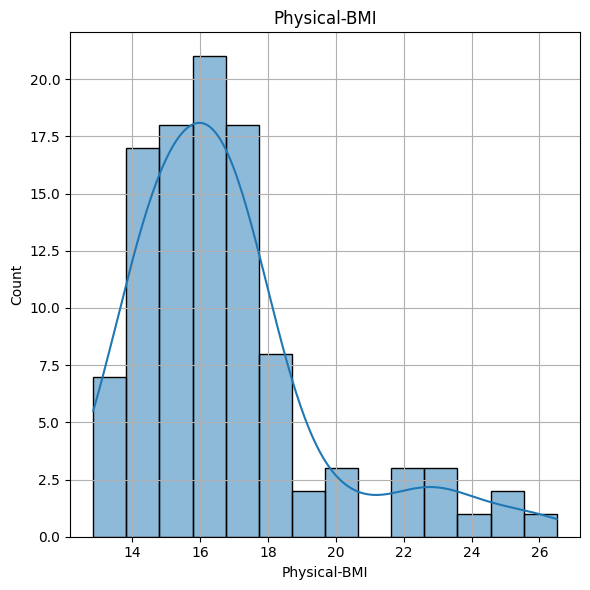

Age group: 6.0


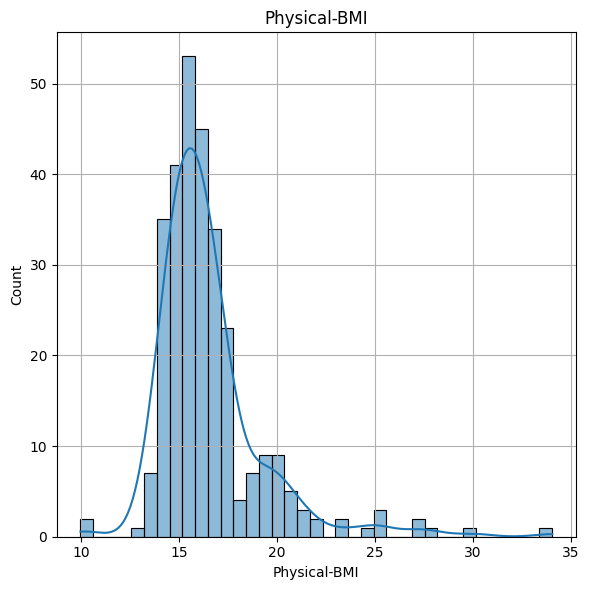

Age group: 7.0


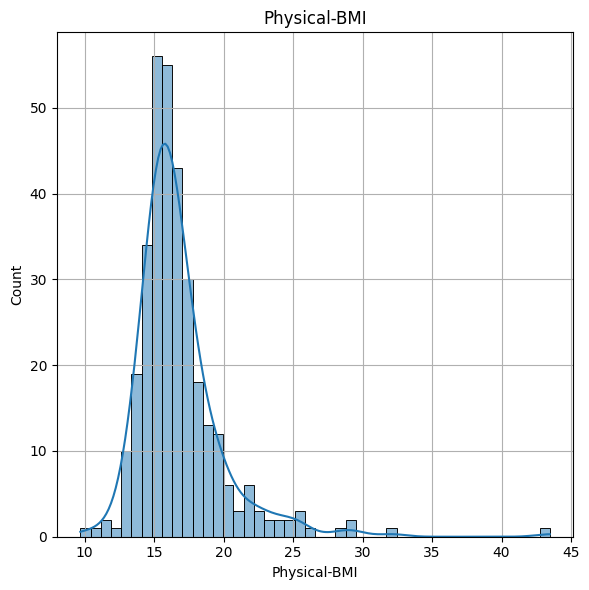

Age group: 8.0


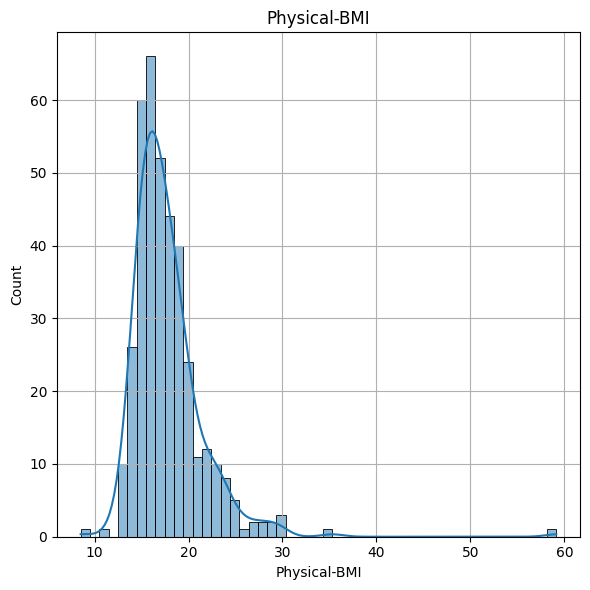

Age group: 9.0


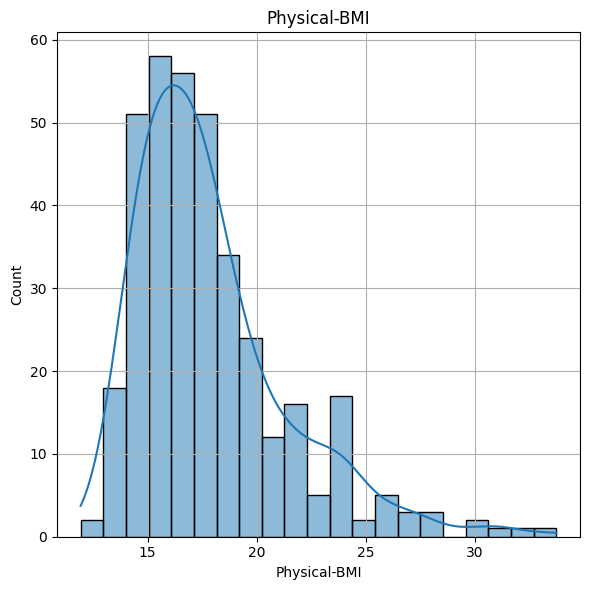

Age group: 10.0


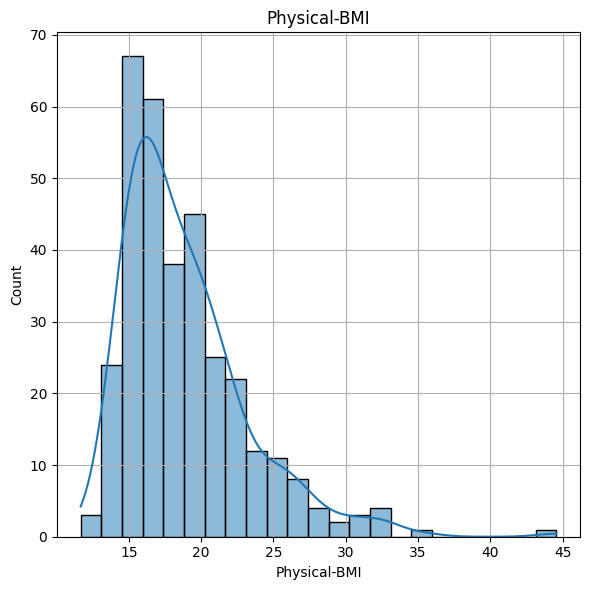

Age group: 11.0


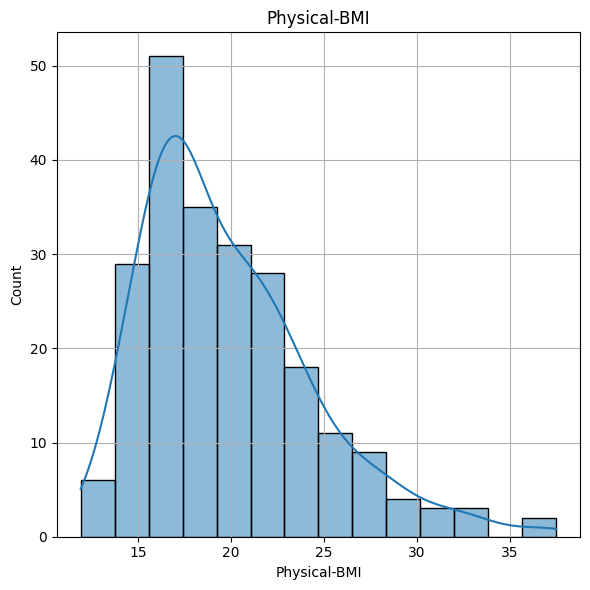

Age group: 12.0


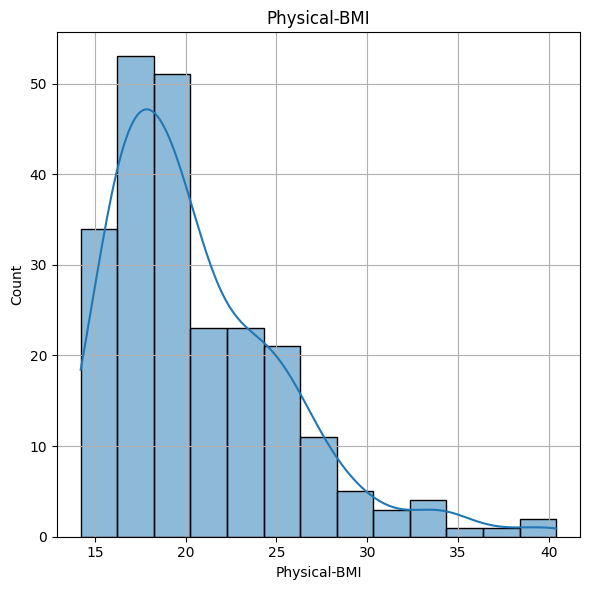

Age group: 13.0


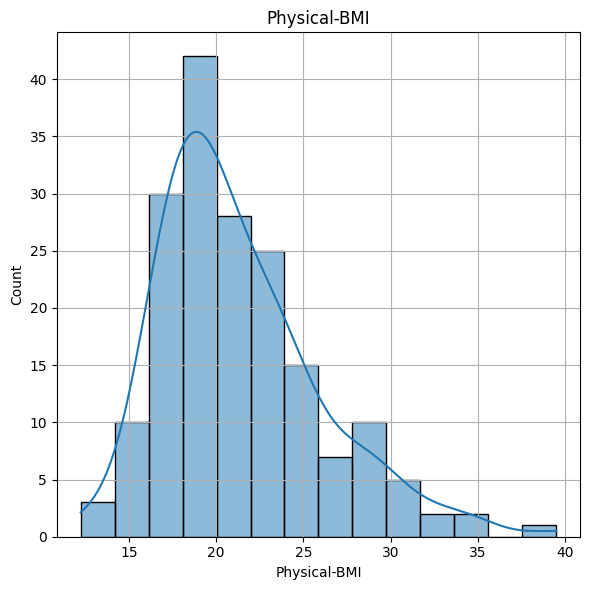

Age group: 14.0


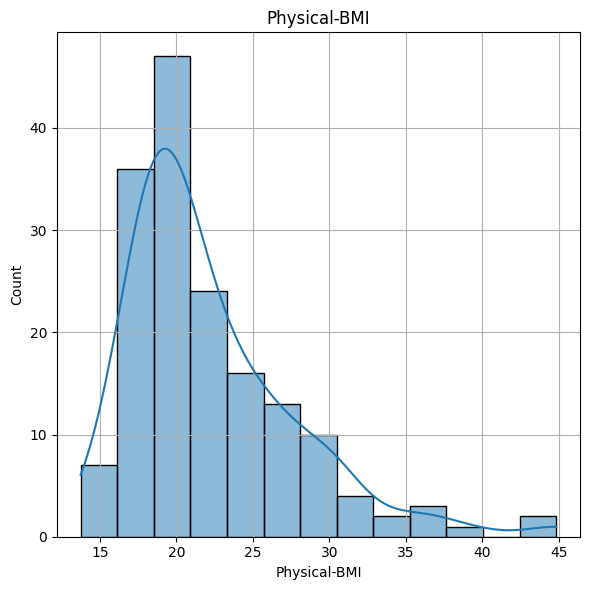

Age group: 15.0


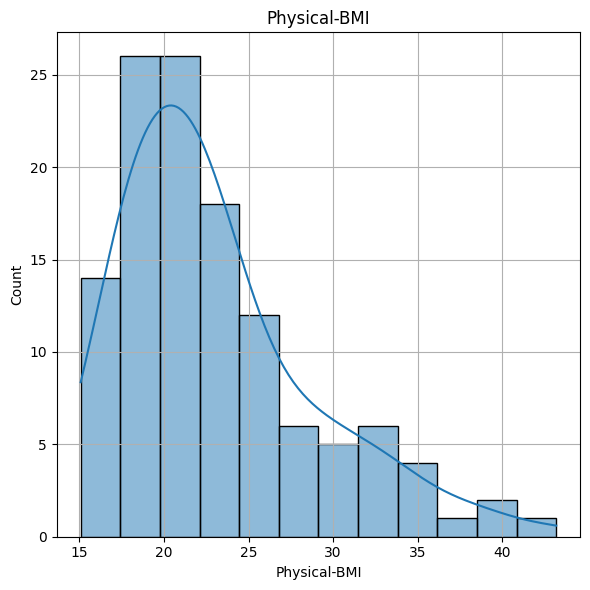

Age group: 16.0


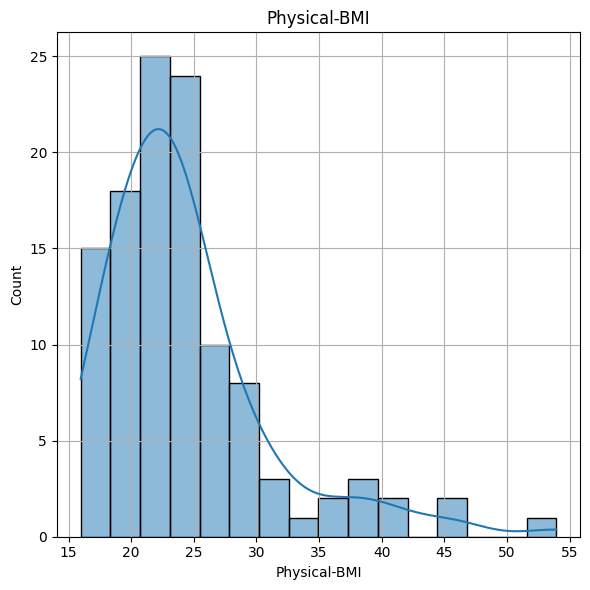

Age group: 17.0


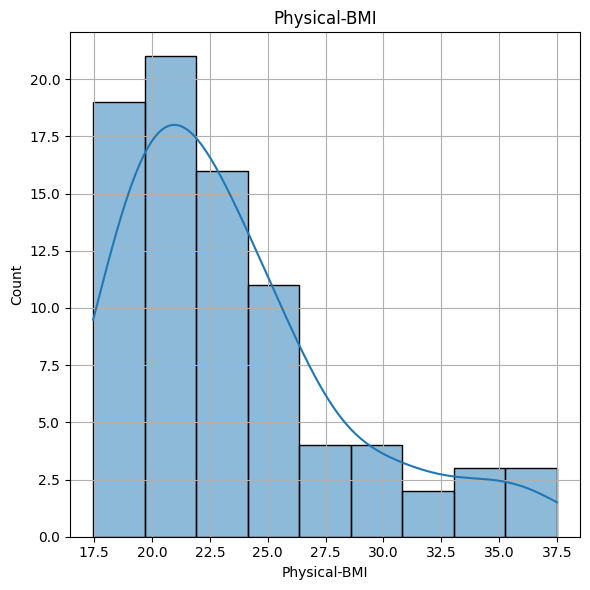

Age group: 18.0


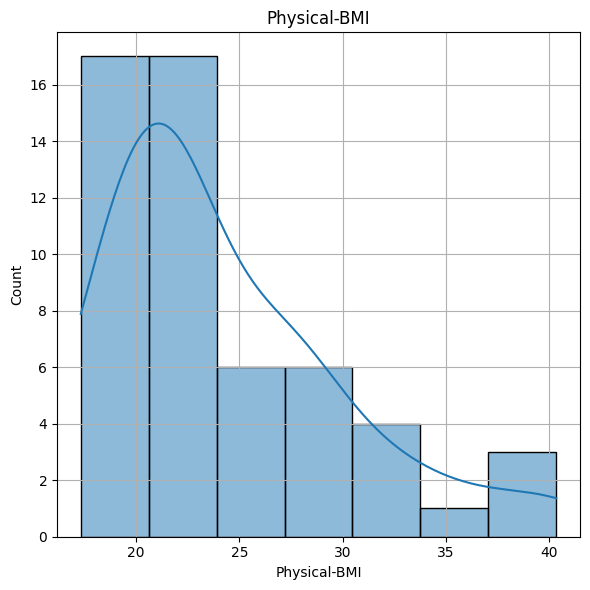

Age group: 19.0


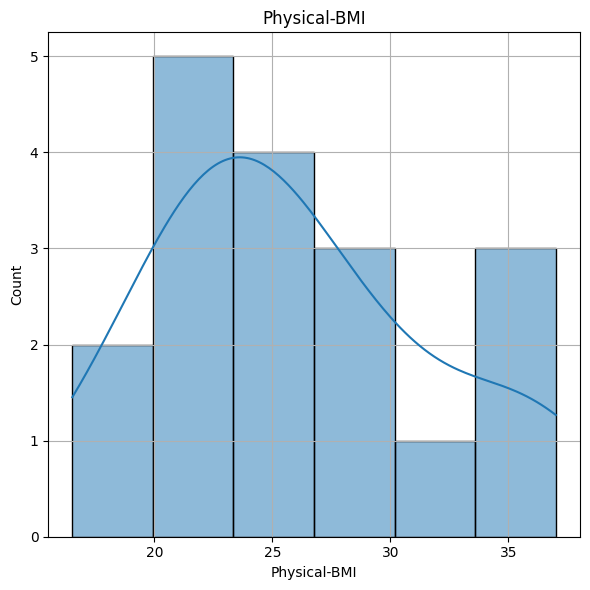

Age group: 20.0


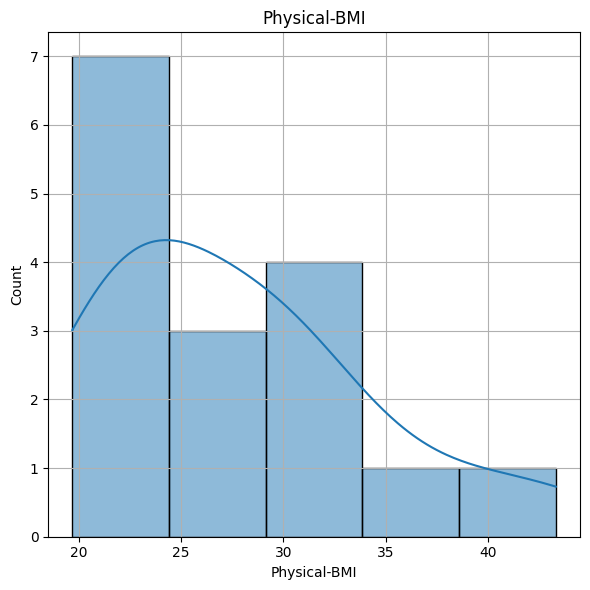

Age group: 21.0


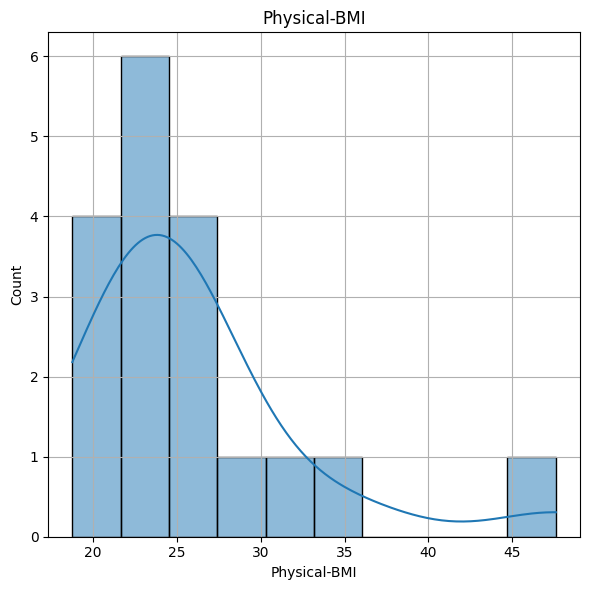

Age group: 22.0


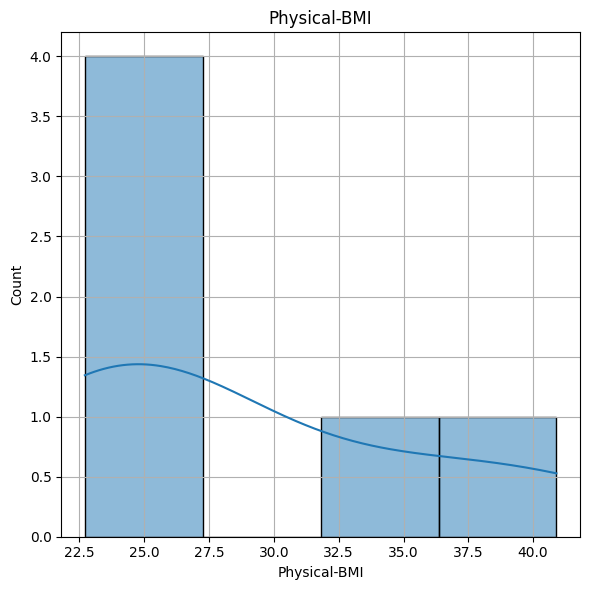

In [173]:
for age in age_groups:
    age_group_df = train_df[train_df['Basic_Demos-Age'] == age]
    print(f"Age group: {age}")
    hist_plot('Physical-BMI', age_group_df)


In [174]:
# Setting the missing values to the median of the age group and dropping outliers
column_of_interest = 'Physical-BMI'
for age in age_groups:
    age_group_df = train_df[train_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest] = train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    train_df = train_df[~((train_df['Basic_Demos-Age'] == age) & ((train_df[column_of_interest] < lower_bound) | (train_df[column_of_interest] > upper_bound)))]

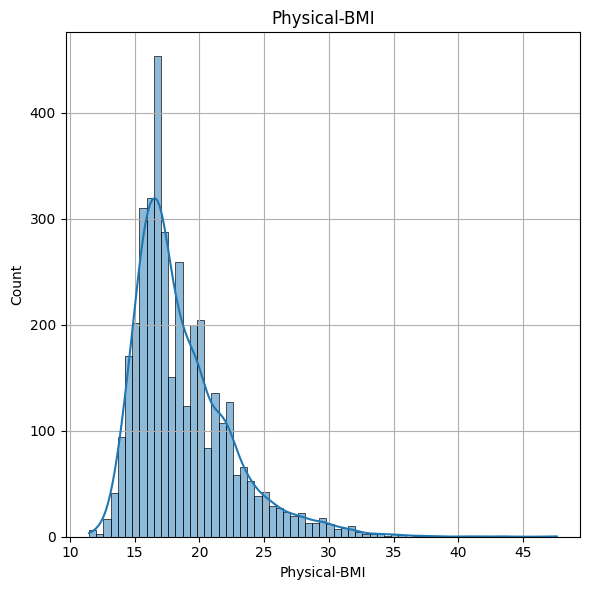

In [175]:
hist_plot('Physical-BMI', train_df)

In [176]:
get_null_percentage('Physical-BMI', train_df)

Null percentage for Physical-BMI: 0.79


In [177]:
display(train_df)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-PCIAT_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,sii
0,00008ff9,2.0,5.0,0.0,3.0,51.0,2.0,16.877316,46.0,50.8,...,4.0,2.0,4.0,55.0,NaN,NaN,NaN,2.0,3.0,2.0
1,000fd460,1.0,9.0,0.0,NaN,NaN,2.0,14.035590,48.0,46.0,...,0.0,0.0,0.0,0.0,2.0,46.0,64.0,1.0,0.0,0.0
2,00105258,1.0,10.0,1.0,2.0,71.0,2.0,16.648696,56.5,75.6,...,2.0,1.0,1.0,28.0,2.0,38.0,54.0,1.0,2.0,0.0
3,00115b9f,3.0,9.0,0.0,2.0,71.0,1.0,18.292347,56.0,81.6,...,3.0,4.0,1.0,44.0,1.0,31.0,45.0,3.0,0.0,1.0
4,0016bb22,0.0,18.0,1.0,1.0,NaN,NaN,22.428580,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3955,ff8a2de4,2.0,13.0,0.0,0.0,60.0,2.0,16.362460,59.5,82.4,...,1.0,1.0,0.0,32.0,3.0,35.0,50.0,2.0,1.0,1.0
3956,ffa9794a,3.0,10.0,0.0,NaN,NaN,0.0,18.764678,53.5,76.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0.0,NaN
3957,ffcd4dbd,2.0,11.0,0.0,0.0,68.0,3.0,21.441500,60.0,109.8,...,1.0,0.0,1.0,31.0,3.0,56.0,77.0,2.0,0.0,1.0
3958,ffed1dd5,0.0,13.0,0.0,0.0,70.0,3.0,12.235895,70.7,87.0,...,1.0,1.0,1.0,19.0,0.0,33.0,47.0,0.0,1.0,0.0


### BIA null values

#### Analysis

In [178]:
columns_of_interest = bia_df.columns.to_list()
columns_of_interest.remove('BIA-BIA_BMI')
columns_of_interest.remove('BIA-Season')
columns_of_interest.remove('BIA-BIA_Activity_Level_num')
columns_of_interest.remove('BIA-BIA_Frame_num')

In [179]:
for col in columns_of_interest:
    get_null_percentage(col, train_df)

Null percentage for BIA-BIA_BMC: 52.46
Null percentage for BIA-BIA_BMR: 50.54
Null percentage for BIA-BIA_DEE: 50.56
Null percentage for BIA-BIA_ECW: 50.91
Null percentage for BIA-BIA_FFM: 56.00
Null percentage for BIA-BIA_FFMI: 50.49
Null percentage for BIA-BIA_FMI: 51.20
Null percentage for BIA-BIA_Fat: 51.30
Null percentage for BIA-BIA_ICW: 53.53
Null percentage for BIA-BIA_LDM: 50.59
Null percentage for BIA-BIA_LST: 54.95
Null percentage for BIA-BIA_SMM: 50.62
Null percentage for BIA-BIA_TBW: 51.35


In [180]:
# Based on the first correlation matrix, these are the columns we would like to investigate
bia_corr_columns = ['Basic_Demos-Age', 'Physical-BMI', 'Physical-Height', 'Physical-Weight']

===== BIA-BIA_BMC =====


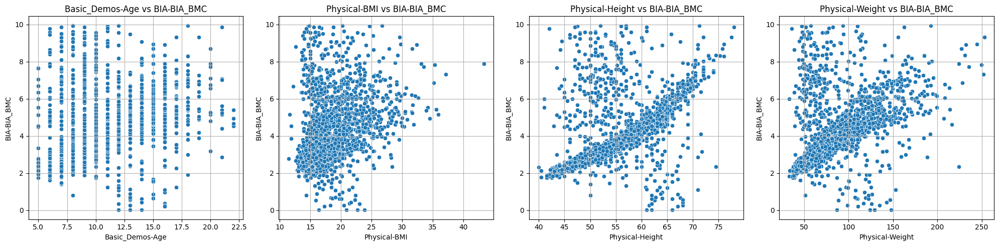

===== BIA-BIA_BMR =====


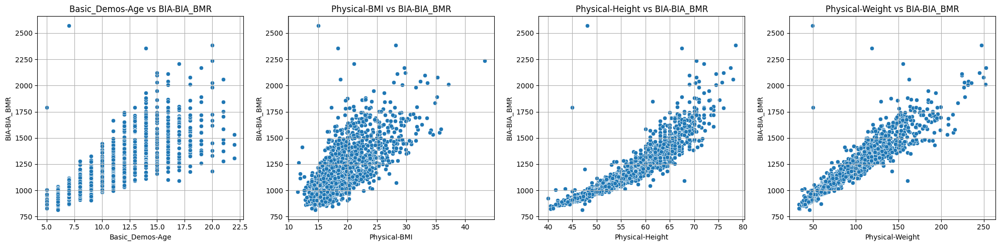

===== BIA-BIA_DEE =====


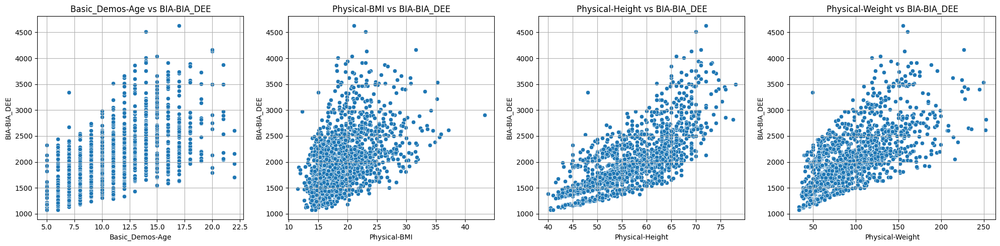

===== BIA-BIA_ECW =====


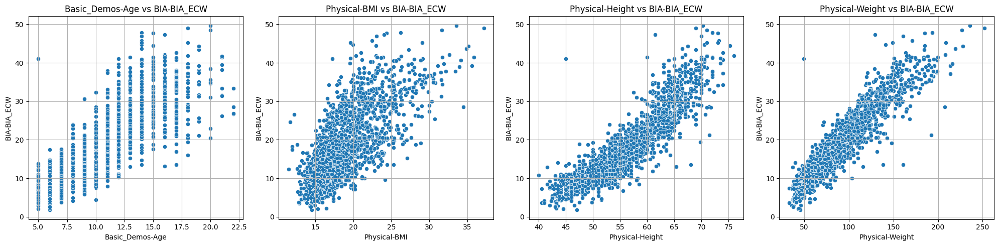

===== BIA-BIA_FFM =====


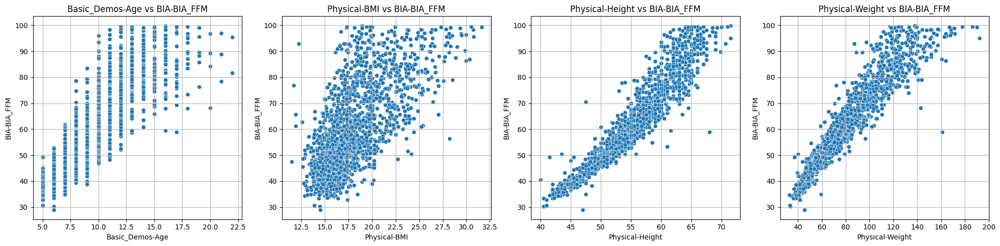

===== BIA-BIA_FFMI =====


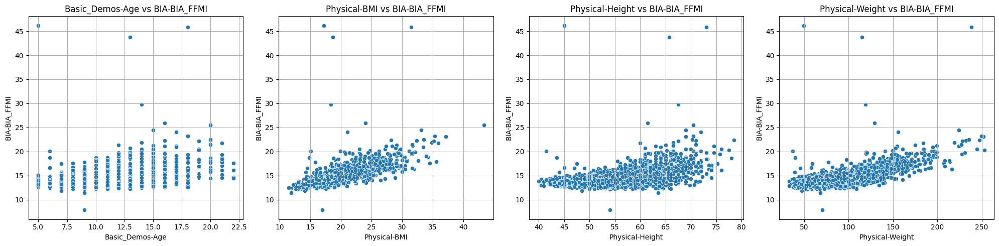

===== BIA-BIA_FMI =====


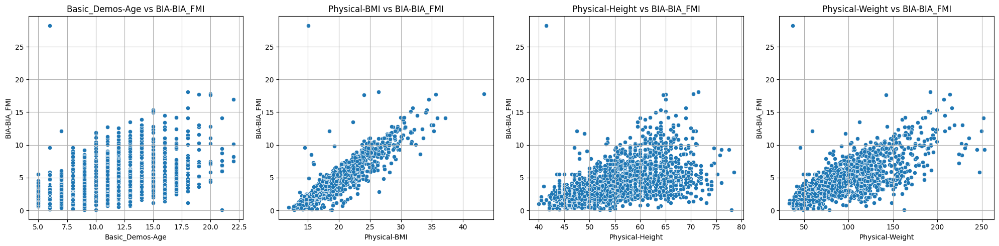

===== BIA-BIA_Fat =====


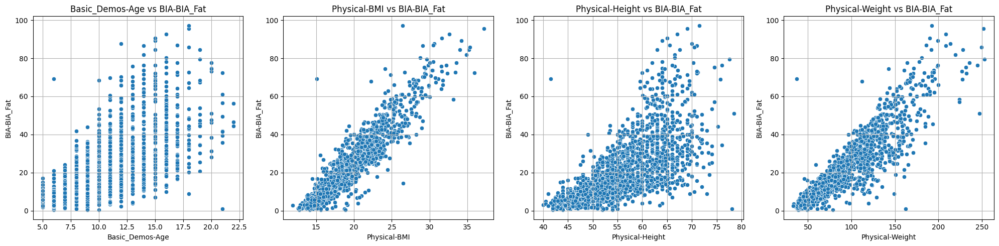

===== BIA-BIA_ICW =====


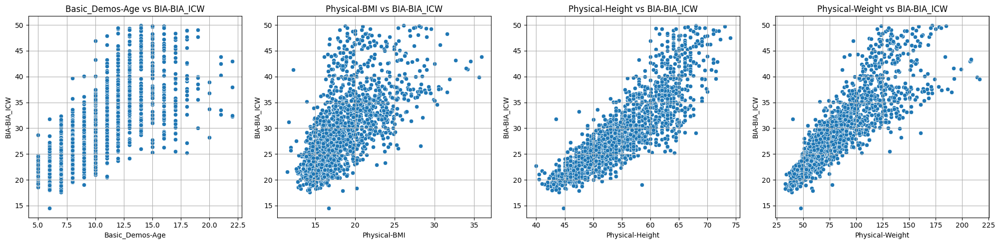

===== BIA-BIA_LDM =====


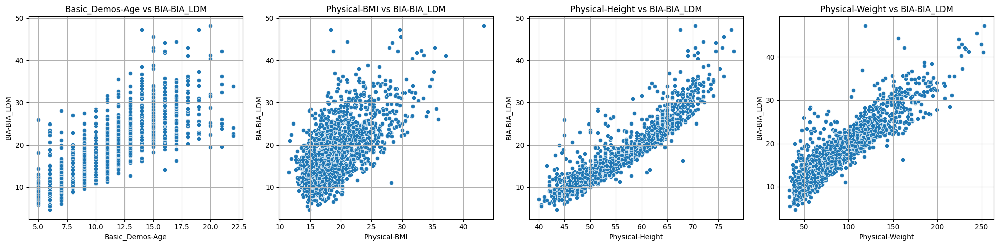

===== BIA-BIA_LST =====


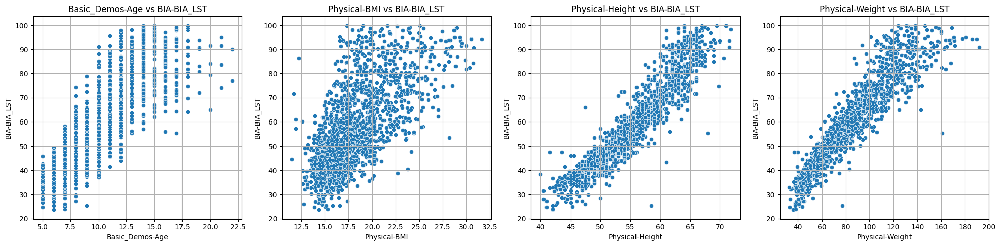

===== BIA-BIA_SMM =====


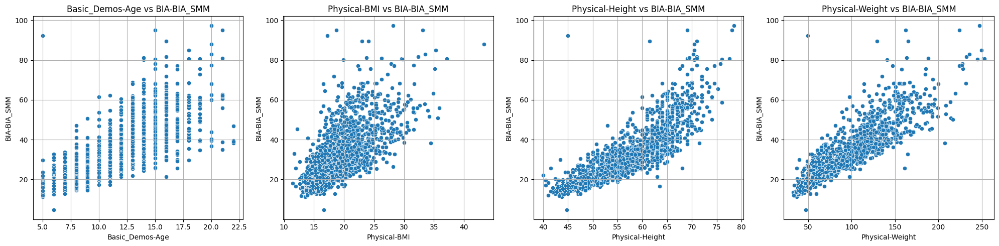

===== BIA-BIA_TBW =====


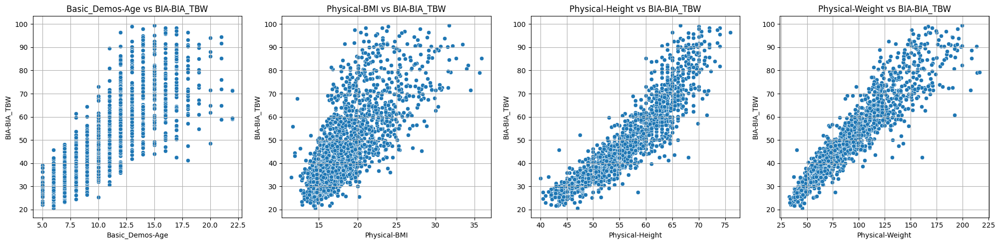

In [181]:
for col in columns_of_interest:
    print(f"===== {col} =====")
    scatter_plots(bia_corr_columns, col, train_df)

#### Model training and prediction
Seems that it could be possible to use regression for imputing these values. Lets see if training few models give good results

In [182]:
results = {}
for col in columns_of_interest:
    training_df = train_df.copy().dropna(subset=[col] + bia_corr_columns)

    X = training_df[bia_corr_columns].values
    y = training_df[col].values

    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    results[col] = []

    for model_name, model in regression_models.items():
        model.fit(X_train, y_train)
        y_val_pred = model.predict(X_val)
        val_mse = mean_squared_error(y_val, y_val_pred)
        val_r2 = r2_score(y_val, y_val_pred)
        y_test_pred = model.predict(X_test)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_r2 = r2_score(y_test, y_test_pred)
        
        results[col].append({
            'Model': model_name,
            'Validation MSE': val_mse,
            'Validation R²': val_r2,
            'Test MSE': test_mse,
            'Test R²': test_r2
        })

best_models = {}
for col, result in results.items():
    best_model = max(result, key=lambda x: (x['Validation R²'], x['Test R²']))
    best_models[col] = best_model

for col, best_model in best_models.items():
    print(f"{col}: {best_model['Model']} => Validation R²: {best_model['Validation R²']}, Test R²: {best_model['Test R²']}")

BIA-BIA_BMC: Ridge Regression => Validation R²: 0.12259893229578689, Test R²: 0.20022546820313591
BIA-BIA_BMR: K-Nearest Neighbors Regressor => Validation R²: 0.9617609452348601, Test R²: 0.8281528576040978
BIA-BIA_DEE: Ridge Regression => Validation R²: 0.5957484269335611, Test R²: 0.6053739183419361
BIA-BIA_ECW: Ridge Regression => Validation R²: 0.9068872015487758, Test R²: 0.861632550901462
BIA-BIA_FFM: Gradient Boosting Regressor => Validation R²: 0.9308028508139546, Test R²: 0.9596465117788874
BIA-BIA_FFMI: Ridge Regression => Validation R²: 0.7500858542317737, Test R²: 0.6842333800702407
BIA-BIA_FMI: Linear Regression => Validation R²: 0.9027310822657727, Test R²: 0.6556517209514672
BIA-BIA_Fat: Linear Regression => Validation R²: 0.9132146221557446, Test R²: 0.88797833776933
BIA-BIA_ICW: Gradient Boosting Regressor => Validation R²: 0.7993249050259785, Test R²: 0.7539345439453782
BIA-BIA_LDM: Ridge Regression => Validation R²: 0.8889383845909162, Test R²: 0.9124630368085082
BIA

Seeing that we have some good values, we will use the ones with score better than 0.7 for imputing.

In [183]:
columns_for_prediction = {}
for col, best_model in best_models.items():
    if best_model['Test R²'] > 0.7 and best_model['Validation R²'] > 0.7:
        columns_for_prediction[col] = best_model['Model']

In [184]:
for col, best_model in columns_for_prediction.items():
    print(f"Column: {col}, Model: {best_model}")
    training_df = train_df.copy().dropna(subset=[col] + bia_corr_columns)

    prediction_df = train_df[train_df[col].isnull()]
    prediction_df = prediction_df.dropna(subset=bia_corr_columns)

    X = training_df[bia_corr_columns].values
    y = training_df[col].values

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = regression_models[best_model]
    model.fit(X_train, y_train)
    print(f"Score: {model.score(X_test, y_test)}")

    for index, row in prediction_df.iterrows():
        X = row[bia_corr_columns].values.reshape(1, -1)
        prediction = model.predict(X)
        train_df.loc[index, col] = prediction

Column: BIA-BIA_BMR, Model: K-Nearest Neighbors Regressor
Score: 0.9154640012601837
Column: BIA-BIA_ECW, Model: Ridge Regression
Score: 0.9051302736301398
Column: BIA-BIA_FFM, Model: Gradient Boosting Regressor
Score: 0.9380720220443496
Column: BIA-BIA_Fat, Model: Linear Regression
Score: 0.8859457870986884
Column: BIA-BIA_ICW, Model: Gradient Boosting Regressor
Score: 0.769506916987772
Column: BIA-BIA_LDM, Model: Ridge Regression
Score: 0.8953549907570022
Column: BIA-BIA_LST, Model: Gradient Boosting Regressor
Score: 0.9226143479889413
Column: BIA-BIA_SMM, Model: Lasso Regression
Score: 0.7904268666890825
Column: BIA-BIA_TBW, Model: Gradient Boosting Regressor
Score: 0.897772843847377


In [185]:
for col in columns_of_interest:
    get_null_percentage(col, train_df)

Null percentage for BIA-BIA_BMC: 52.46
Null percentage for BIA-BIA_BMR: 24.32
Null percentage for BIA-BIA_DEE: 50.56
Null percentage for BIA-BIA_ECW: 24.35
Null percentage for BIA-BIA_FFM: 24.45
Null percentage for BIA-BIA_FFMI: 50.49
Null percentage for BIA-BIA_FMI: 51.20
Null percentage for BIA-BIA_Fat: 24.35
Null percentage for BIA-BIA_ICW: 24.38
Null percentage for BIA-BIA_LDM: 24.32
Null percentage for BIA-BIA_LST: 24.38
Null percentage for BIA-BIA_SMM: 24.32
Null percentage for BIA-BIA_TBW: 24.35


### Waist null value
Based on the correlation matrix, a column of interest could be Physical-Waist_Circumference. That is why we will try to keep this column and see if we can impute the empty values for the column.

#### Waist analysis

In [186]:
get_null_percentage('Physical-Waist_Circumference', train_df)

Null percentage for Physical-Waist_Circumference: 77.59


In [187]:
correlation_matrix = train_df.drop(columns=['id']).corr()

waist_corr = correlation_matrix['Physical-Waist_Circumference']

waist_corr_columns = waist_corr[waist_corr.abs() > 0.5].index.tolist()
waist_corr_columns.remove('Physical-Waist_Circumference')

print("Columns that have correlation with Physical-Waist_Circumference:")
print(waist_corr_columns)

Columns that have correlation with Physical-Waist_Circumference:
['Basic_Demos-Age', 'Physical-BMI', 'Physical-Height', 'Physical-Weight', 'BIA-BIA_BMC', 'BIA-BIA_BMR', 'BIA-BIA_DEE', 'BIA-BIA_ECW', 'BIA-BIA_FFM', 'BIA-BIA_FFMI', 'BIA-BIA_FMI', 'BIA-BIA_Fat', 'BIA-BIA_Frame_num', 'BIA-BIA_ICW', 'BIA-BIA_LDM', 'BIA-BIA_LST', 'BIA-BIA_SMM', 'BIA-BIA_TBW']


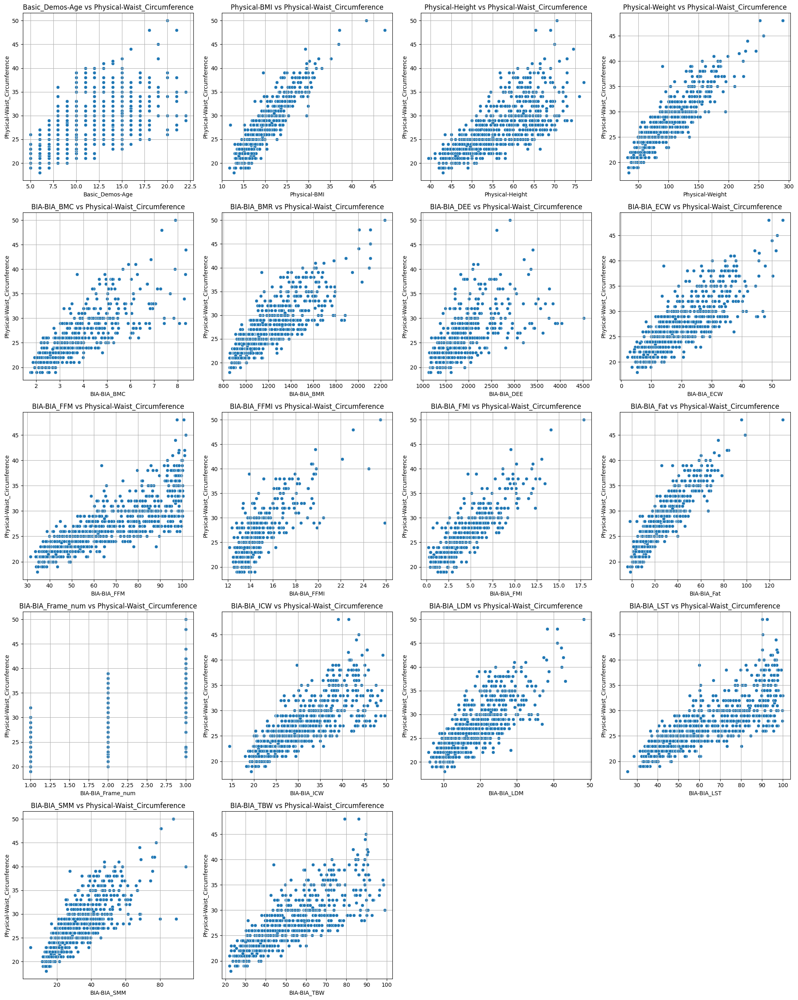

In [188]:
scatter_plots(waist_corr_columns, 'Physical-Waist_Circumference', train_df)

In [189]:
# We won't use columns that spread out too much for better accuracy as we might use regression
waist_corr_columns.remove('BIA-BIA_DEE')
waist_corr_columns.remove('BIA-BIA_FFMI')
# We will not use BMI as it is calculated from weight and height
waist_corr_columns.remove('Physical-BMI')

In [190]:
for col in waist_corr_columns:
    get_null_percentage(col, train_df)

Null percentage for Basic_Demos-Age: 0.00
Null percentage for Physical-Height: 24.45
Null percentage for Physical-Weight: 24.80
Null percentage for BIA-BIA_BMC: 52.46
Null percentage for BIA-BIA_BMR: 24.32
Null percentage for BIA-BIA_ECW: 24.35
Null percentage for BIA-BIA_FFM: 24.45
Null percentage for BIA-BIA_FMI: 51.20
Null percentage for BIA-BIA_Fat: 24.35
Null percentage for BIA-BIA_Frame_num: 50.30
Null percentage for BIA-BIA_ICW: 24.38
Null percentage for BIA-BIA_LDM: 24.32
Null percentage for BIA-BIA_LST: 24.38
Null percentage for BIA-BIA_SMM: 24.32
Null percentage for BIA-BIA_TBW: 24.35


In [191]:
train_df_copy = train_df.copy()

# Drop rows with null values in waist_corr_columns and Physical-Waist_Circumference
train_df_copy.dropna(subset=waist_corr_columns + ['Physical-Waist_Circumference'], inplace=True)

remaining_rows_count = len(train_df_copy)
print(f"Number of rows left: {remaining_rows_count}")

Number of rows left: 489


In [192]:
null_waist_df = train_df[train_df['Physical-Waist_Circumference'].isnull()]

no_null_corr_columns_df = null_waist_df.dropna(subset=waist_corr_columns)

row_count = len(no_null_corr_columns_df)
print(f"Number of rows with no null values in waist_corr_columns but null in Physical-Waist_Circumference: {row_count}")

Number of rows with no null values in waist_corr_columns but null in Physical-Waist_Circumference: 1274


#### Model training

Seeing that there is a correlation and the data is linear, we could use a regression model to fill in empty values by prediction. As there is low number of rows we can use to train, we will use train, validate test and use multiple models. After that we will asses if we can use a regression model

In [193]:
X = train_df_copy[waist_corr_columns].values
y = train_df_copy['Physical-Waist_Circumference'].values

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [194]:
results = []

for model_name, model in regression_models.items():
    model.fit(X_train, y_train)
    y_val_pred = model.predict(X_val)
    val_mse = mean_squared_error(y_val, y_val_pred)
    val_r2 = r2_score(y_val, y_val_pred)
    y_test_pred = model.predict(X_test)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    
    results.append({
        'Model': model_name,
        'Validation MSE': val_mse,
        'Validation R²': val_r2,
        'Test MSE': test_mse,
        'Test R²': test_r2
    })

results_df = pd.DataFrame(results)
display(results_df)

,Model,Validation MSE,Validation R²,Test MSE,Test R²
0,Linear Regression,2.398015,0.882856,2.699123,0.890780
1,Ridge Regression,2.387161,0.883386,2.685960,0.891313
2,Lasso Regression,2.784949,0.863954,3.058031,0.876257
3,Decision Tree Regressor,4.961735,0.757617,6.275510,0.746062
4,Random Forest Regressor,2.617075,0.872155,3.423879,0.861453
5,Gradient Boosting Regressor,2.916799,0.857513,3.506878,0.858094
6,K-Nearest Neighbors Regressor,4.058061,0.801762,5.258367,0.787220
7,Support Vector Regressor,6.530088,0.681003,8.532528,0.654731


In [195]:
best_model = results_df.loc[results_df['Test R²'].idxmax() & results_df['Validation R²'].idxmax()]
print("\nBest Model:")
print(best_model)


Best Model:
Model             Ridge Regression
Validation MSE            2.387161
Validation R²             0.883386
Test MSE                   2.68596
Test R²                   0.891313
Name: 1, dtype: object


#### Predicting new values

The model score is acceptable, so we will fill empty values by predicting with the model

In [196]:
model = regression_models[best_model['Model']]
model.fit(X_train, y_train)

Ridge()

In [197]:
for index, row in no_null_corr_columns_df.iterrows():
    X = row[waist_corr_columns].values.reshape(1, -1)
    waist = model.predict(X)
    train_df.loc[index, 'Physical-Waist_Circumference'] = waist

In [198]:
get_null_percentage('Physical-Waist_Circumference', train_df)

Null percentage for Physical-Waist_Circumference: 44.13


The model filled in about 30% of the data, and now it could be possible to impute the data from other columns.

#### Other imputation

In [199]:
get_null_percentage('Physical-Waist_Circumference', train_df)

Null percentage for Physical-Waist_Circumference: 44.13


In [200]:
group = train_df.groupby('Basic_Demos-Age')['Physical-Waist_Circumference']
display(group.describe())
display(group.median())

,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,72.0,20.749722,3.799600,8.553603,21.000000,21.287356,23.000000,26.000000
6.0,199.0,21.448743,4.332422,0.612796,21.000000,22.000000,23.414982,38.170747
7.0,203.0,21.577117,4.758927,4.196322,21.000000,22.726856,24.000000,30.671263
8.0,269.0,23.029915,4.901223,2.201571,22.000000,24.000000,26.000000,36.000000
9.0,259.0,23.085867,5.143594,4.896529,22.000000,23.841456,26.356727,33.000000
10.0,240.0,24.679756,5.336113,4.761235,22.725614,25.000000,27.495307,39.000000
11.0,163.0,26.759588,5.330014,8.464079,24.000000,26.033224,30.000000,40.000000
12.0,172.0,28.362250,5.436377,8.767982,25.199469,27.564898,31.444352,42.739016
13.0,126.0,30.831101,4.865785,23.402304,27.277183,30.000000,33.835062,47.611657


Basic_Demos-Age
5.0     21.287356
6.0     22.000000
7.0     22.726856
8.0     24.000000
9.0     23.841456
10.0    25.000000
11.0    26.033224
12.0    27.564898
13.0    30.000000
14.0    29.019411
15.0    30.241868
16.0    31.000000
17.0    31.238297
18.0    31.146576
19.0    35.107468
20.0    33.113216
21.0    33.000000
22.0    35.000000
Name: Physical-Waist_Circumference, dtype: float64

Age group: 5.0


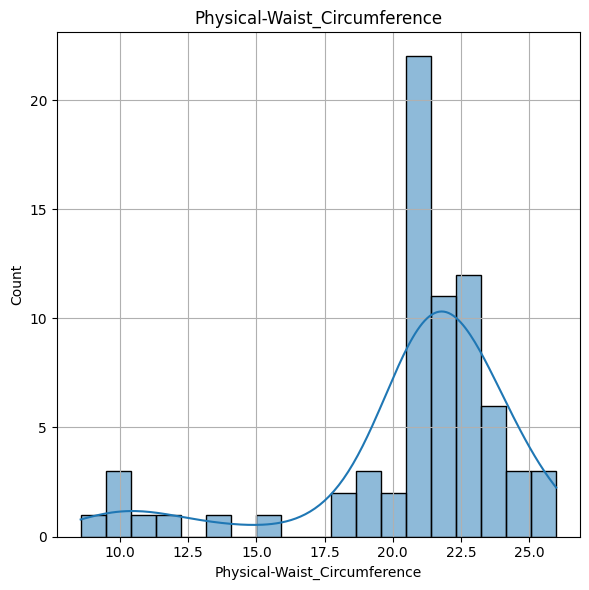

Age group: 6.0


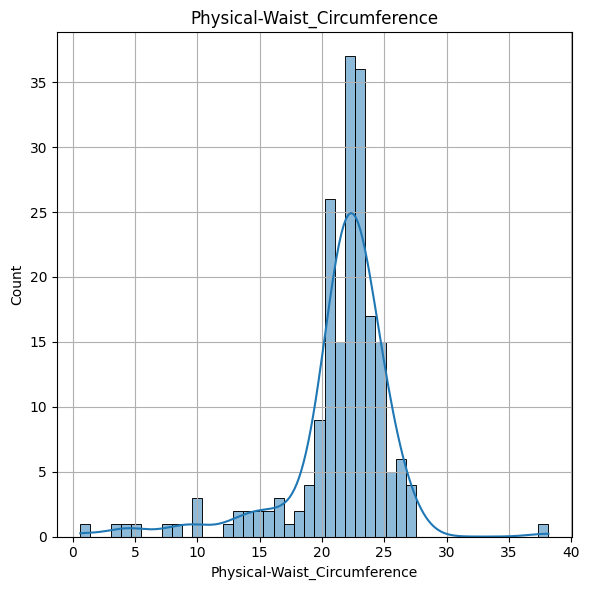

Age group: 7.0


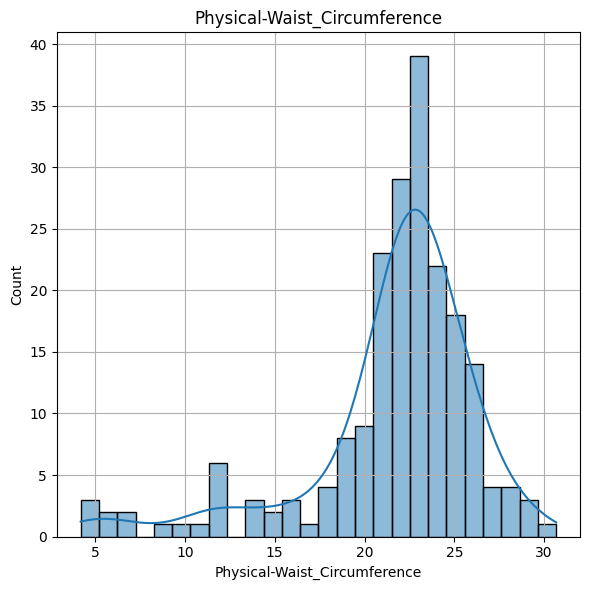

Age group: 8.0


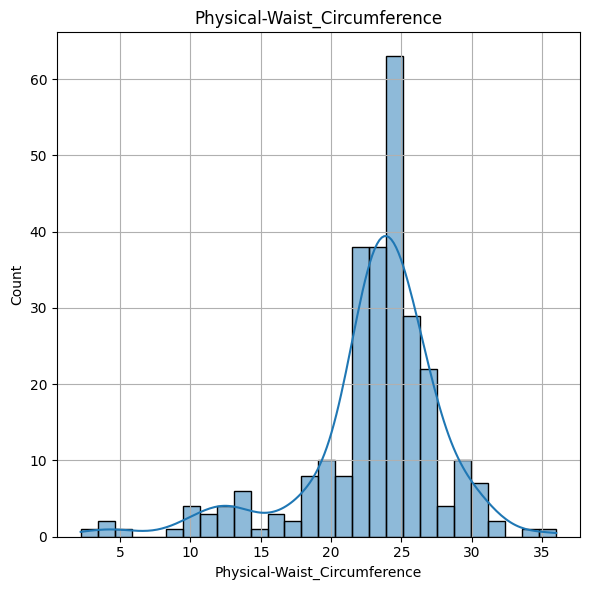

Age group: 9.0


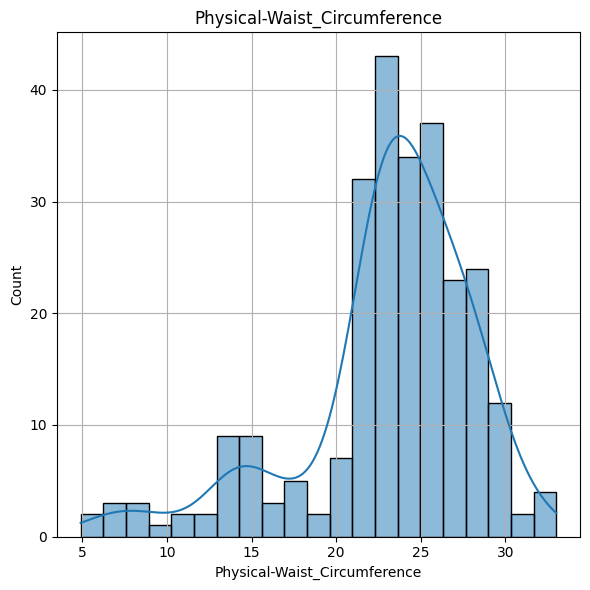

Age group: 10.0


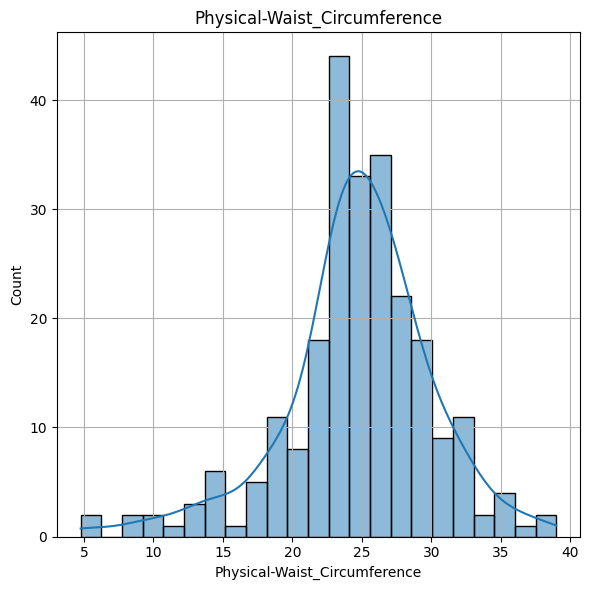

Age group: 11.0


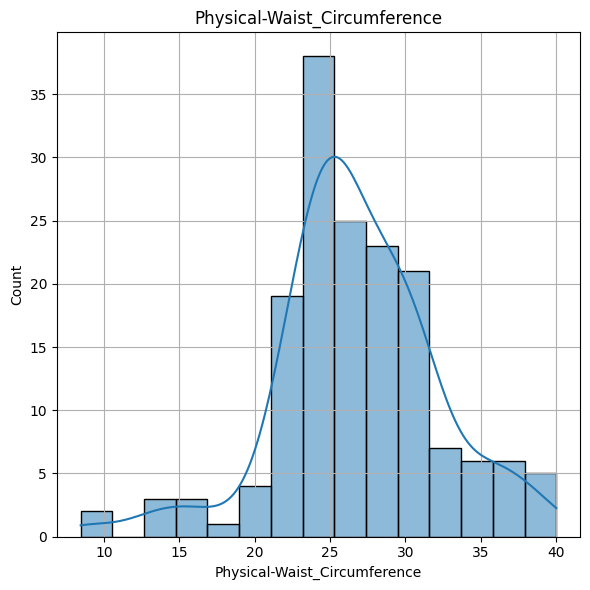

Age group: 12.0


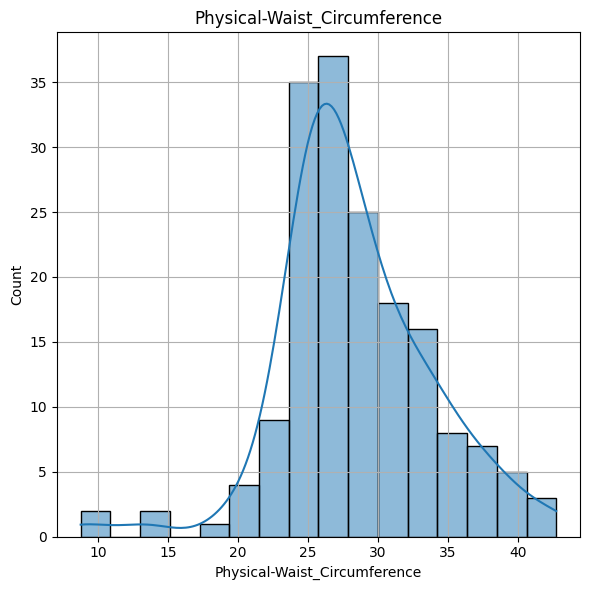

Age group: 13.0


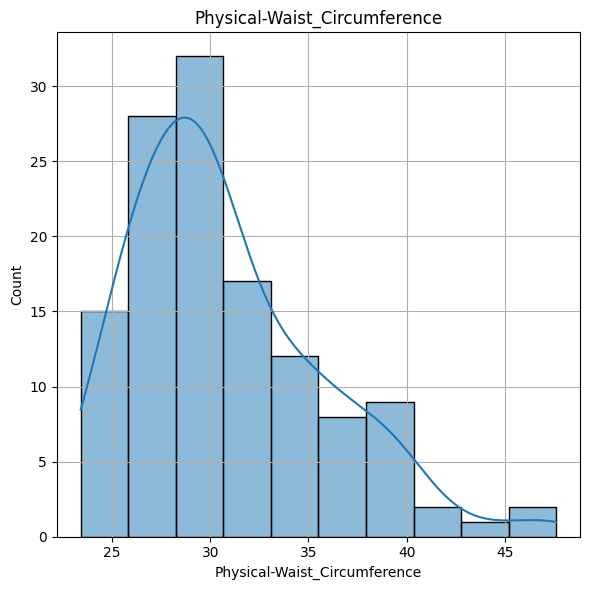

Age group: 14.0


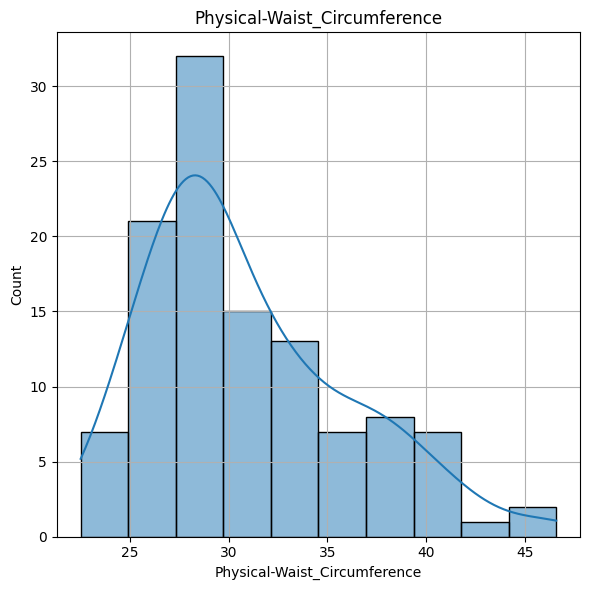

Age group: 15.0


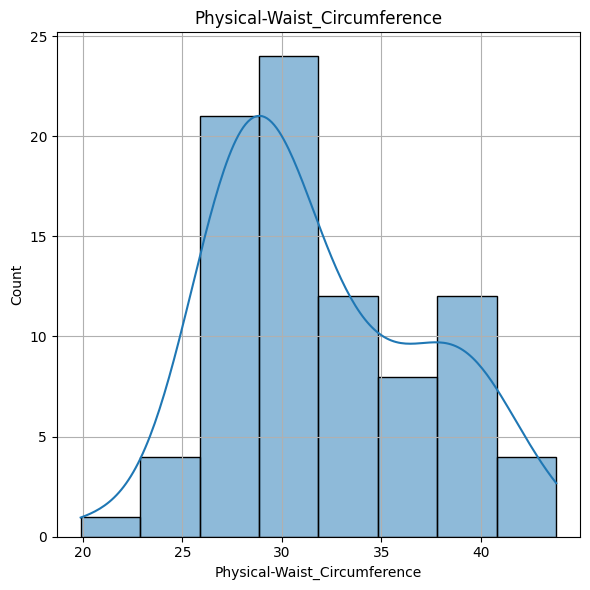

Age group: 16.0


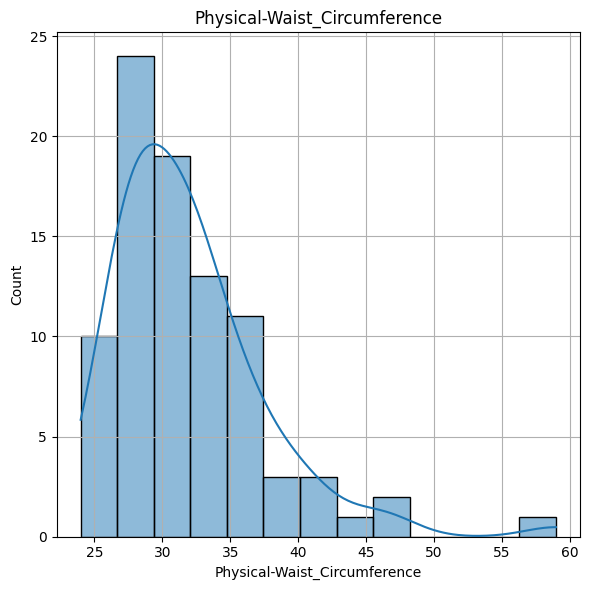

Age group: 17.0


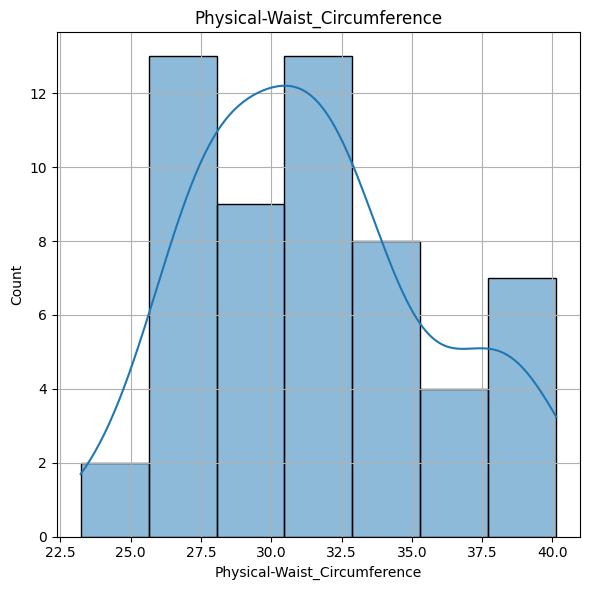

Age group: 18.0


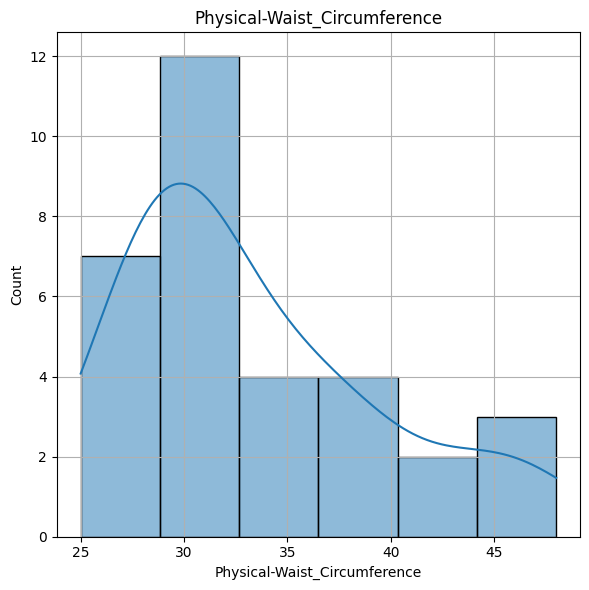

Age group: 19.0


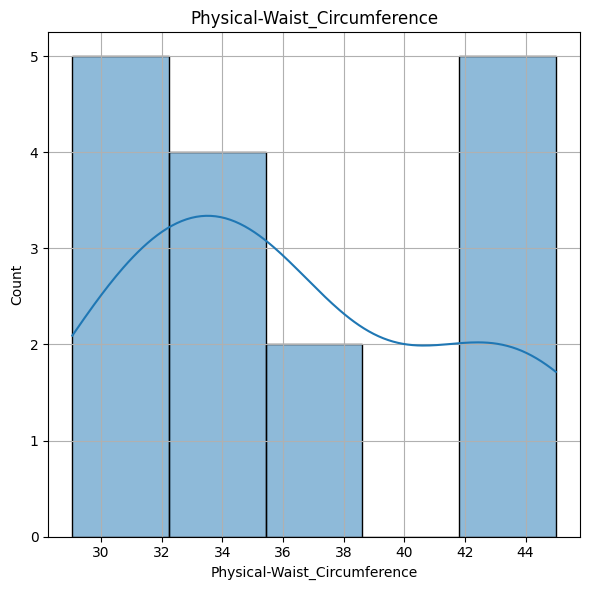

Age group: 20.0


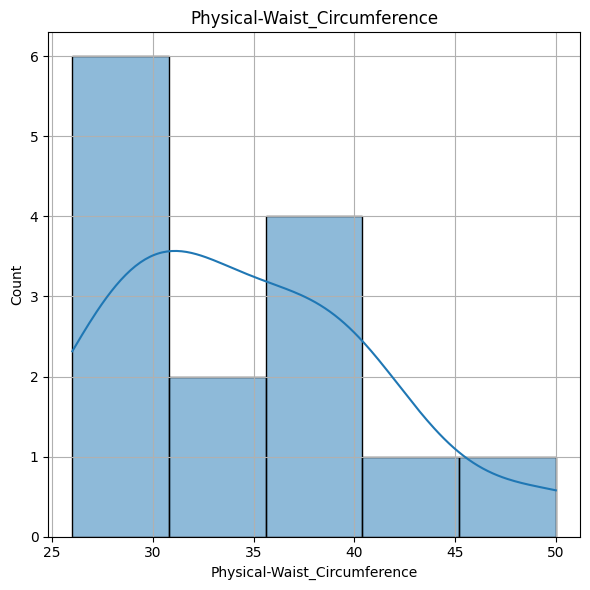

Age group: 21.0


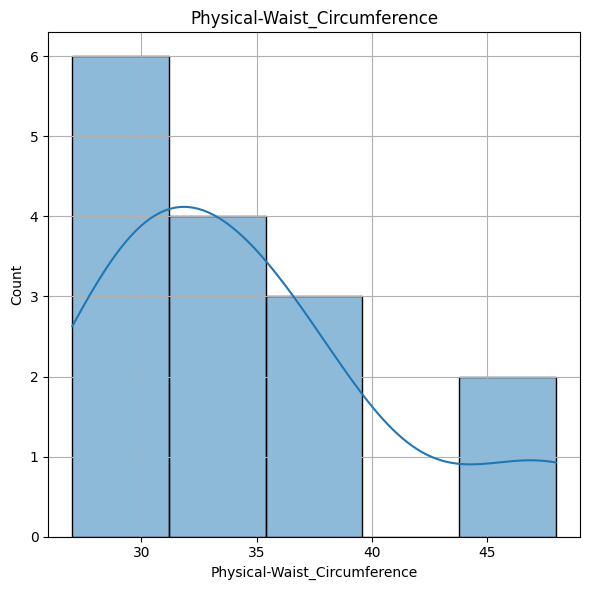

Age group: 22.0


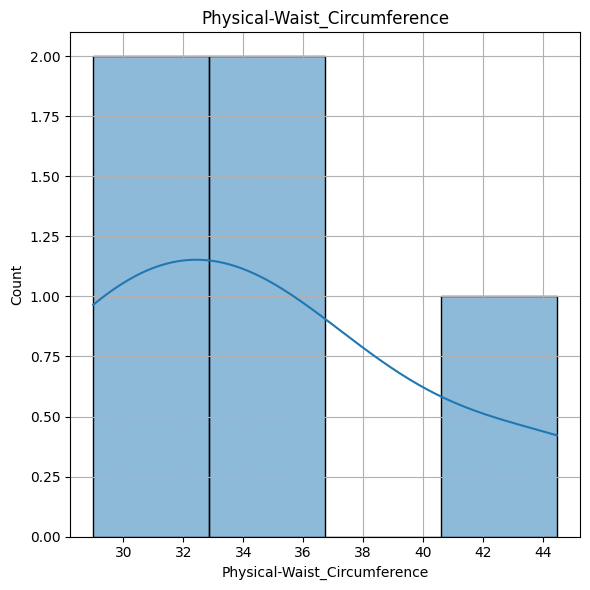

In [201]:
for age in age_groups:
    age_group_df = train_df[train_df['Basic_Demos-Age'] == age]
    print(f"Age group: {age}")
    hist_plot('Physical-Waist_Circumference', age_group_df)

In [202]:
# Setting the missing values to the median of the age group and dropping outliers
column_of_interest = 'Physical-Waist_Circumference'
for age in age_groups:
    age_group_df = train_df[train_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest] = train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    train_df = train_df[~((train_df['Basic_Demos-Age'] == age) & ((train_df[column_of_interest] < lower_bound) | (train_df[column_of_interest] > upper_bound)))]

In [203]:
get_null_percentage('Physical-Waist_Circumference', train_df)

Null percentage for Physical-Waist_Circumference: 1.04


### Diastolic and Systolic

In [204]:
get_null_percentage('Physical-Diastolic_BP', train_df)
get_null_percentage('Physical-Systolic_BP', train_df)

Null percentage for Physical-Diastolic_BP: 27.72
Null percentage for Physical-Systolic_BP: 27.22


In [205]:
print("Diastolic BP")
age_groups_diastolic = train_df.groupby('Basic_Demos-Age')['Physical-Diastolic_BP']
display(age_groups_diastolic.describe())
display(age_groups_diastolic.median())
print("Systolic BP")
age_groups_systolic = train_df.groupby('Basic_Demos-Age')['Physical-Systolic_BP']
display(age_groups_diastolic.describe())
display(age_groups_diastolic.median())

Diastolic BP


,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,77.0,69.662338,15.476307,35.0,60.00,66.0,77.00,120.0
6.0,235.0,67.127660,12.988517,32.0,58.00,65.0,73.00,117.0
7.0,255.0,66.352941,12.070696,35.0,59.00,65.0,72.00,119.0
8.0,325.0,67.649231,11.994084,35.0,60.00,67.0,74.00,117.0
9.0,306.0,69.078431,12.178740,40.0,61.00,67.0,75.00,118.0
10.0,293.0,68.136519,11.543031,39.0,61.00,67.0,73.00,116.0
11.0,213.0,70.633803,11.218128,40.0,63.00,70.0,75.00,110.0
12.0,211.0,68.189573,12.081946,42.0,61.00,67.0,73.50,120.0
13.0,171.0,69.046784,11.241108,48.0,60.50,68.0,76.00,103.0


Basic_Demos-Age
5.0     66.0
6.0     65.0
7.0     65.0
8.0     67.0
9.0     67.0
10.0    67.0
11.0    70.0
12.0    67.0
13.0    68.0
14.0    70.0
15.0    70.0
16.0    70.0
17.0    70.0
18.0    74.0
19.0    73.5
20.0    72.5
21.0    74.0
22.0    76.0
Name: Physical-Diastolic_BP, dtype: float64

Systolic BP


,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,77.0,69.662338,15.476307,35.0,60.00,66.0,77.00,120.0
6.0,235.0,67.127660,12.988517,32.0,58.00,65.0,73.00,117.0
7.0,255.0,66.352941,12.070696,35.0,59.00,65.0,72.00,119.0
8.0,325.0,67.649231,11.994084,35.0,60.00,67.0,74.00,117.0
9.0,306.0,69.078431,12.178740,40.0,61.00,67.0,75.00,118.0
10.0,293.0,68.136519,11.543031,39.0,61.00,67.0,73.00,116.0
11.0,213.0,70.633803,11.218128,40.0,63.00,70.0,75.00,110.0
12.0,211.0,68.189573,12.081946,42.0,61.00,67.0,73.50,120.0
13.0,171.0,69.046784,11.241108,48.0,60.50,68.0,76.00,103.0


Basic_Demos-Age
5.0     66.0
6.0     65.0
7.0     65.0
8.0     67.0
9.0     67.0
10.0    67.0
11.0    70.0
12.0    67.0
13.0    68.0
14.0    70.0
15.0    70.0
16.0    70.0
17.0    70.0
18.0    74.0
19.0    73.5
20.0    72.5
21.0    74.0
22.0    76.0
Name: Physical-Diastolic_BP, dtype: float64

Seeing a general increase as before so we will impute based on age group

In [206]:
# Setting the missing values to the median of the age group and dropping outliers
column_of_interest = 'Physical-Diastolic_BP'
for age in age_groups:
    age_group_df = train_df[train_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest] = train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    train_df = train_df[~((train_df['Basic_Demos-Age'] == age) & ((train_df[column_of_interest] < lower_bound) | (train_df[column_of_interest] > upper_bound)))]

In [207]:
# Setting the missing values to the median of the age group and dropping outliers
column_of_interest = 'Physical-Systolic_BP'
for age in age_groups:
    age_group_df = train_df[train_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest] = train_df.loc[train_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    train_df = train_df[~((train_df['Basic_Demos-Age'] == age) & ((train_df[column_of_interest] < lower_bound) | (train_df[column_of_interest] > upper_bound)))]

In [208]:
get_null_percentage('Physical-Diastolic_BP', train_df)
get_null_percentage('Physical-Systolic_BP', train_df)

Null percentage for Physical-Diastolic_BP: 0.90
Null percentage for Physical-Systolic_BP: 0.90


### FGC
Columns to drop FGC-FGC_GSND, FGC-FGC_GSD

#### Analysis

In [209]:
# From the correlation matrix, we will take these columns and try to fill the missing values if possible
columns_of_interest = ['FGC-FGC_CU', 'FGC-FGC_GSND', 'FGC-FGC_GSD', 'FGC-FGC_PU', 'FGC-FGC_TL']
columns_of_interest

['FGC-FGC_CU', 'FGC-FGC_GSND', 'FGC-FGC_GSD', 'FGC-FGC_PU', 'FGC-FGC_TL']

In [210]:
for col in columns_of_interest:
    get_null_percentage(col, train_df)

Null percentage for FGC-FGC_CU: 43.83
Null percentage for FGC-FGC_GSND: 72.42
Null percentage for FGC-FGC_GSD: 72.39
Null percentage for FGC-FGC_PU: 44.12
Null percentage for FGC-FGC_TL: 43.77


In [211]:
# As we have good amount of columns with low amount of missing values we will see how they are correlated with columns of interest.
low_null_cols = basic_demos_df.columns.tolist() + physical_df.columns.tolist()
low_null_cols.remove('Basic_Demos-Enroll_Season')
low_null_cols.remove('Physical-Season')
low_null_cols

['Basic_Demos-Age',
 'Basic_Demos-Sex',
 'Physical-BMI',
 'Physical-Height',
 'Physical-Weight',
 'Physical-Waist_Circumference',
 'Physical-Diastolic_BP',
 'Physical-HeartRate',
 'Physical-Systolic_BP']

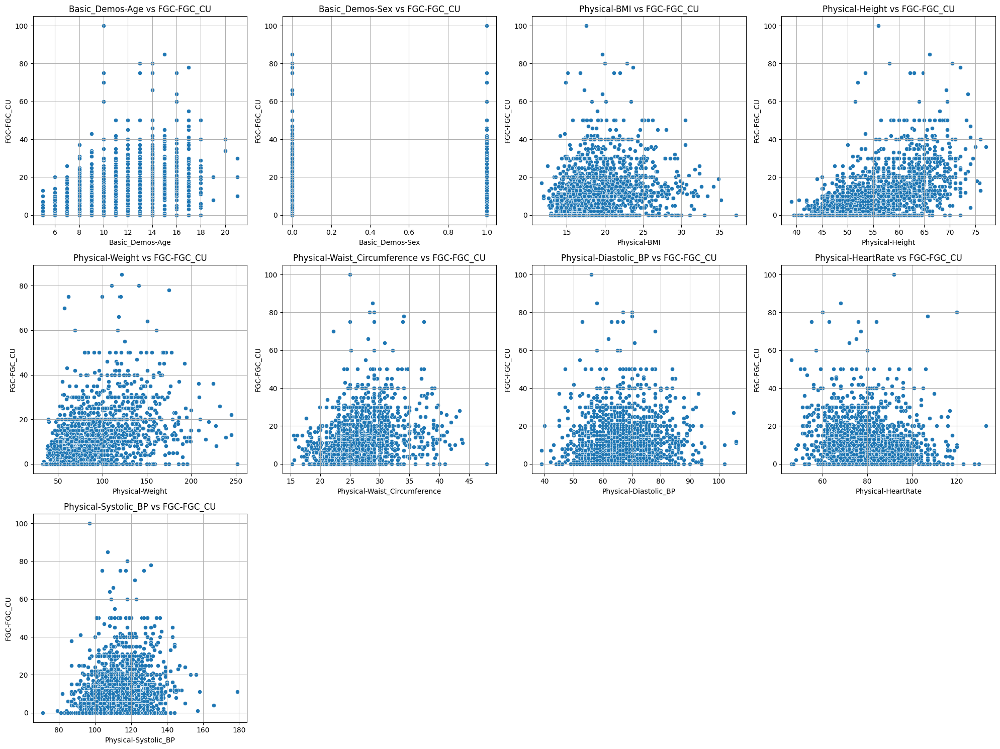

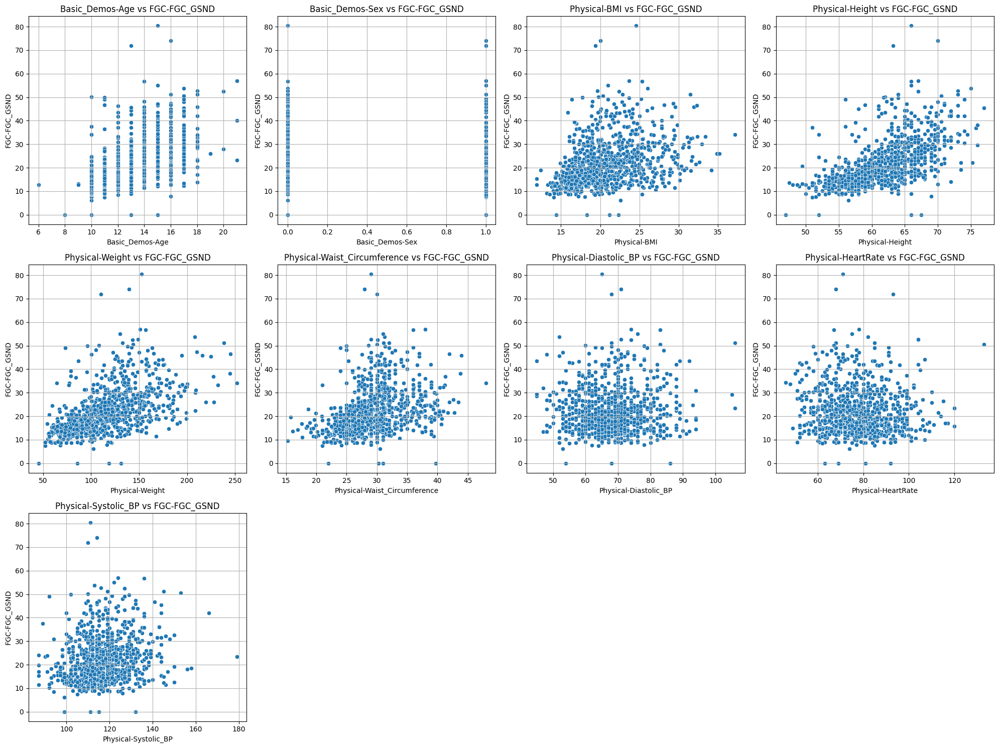

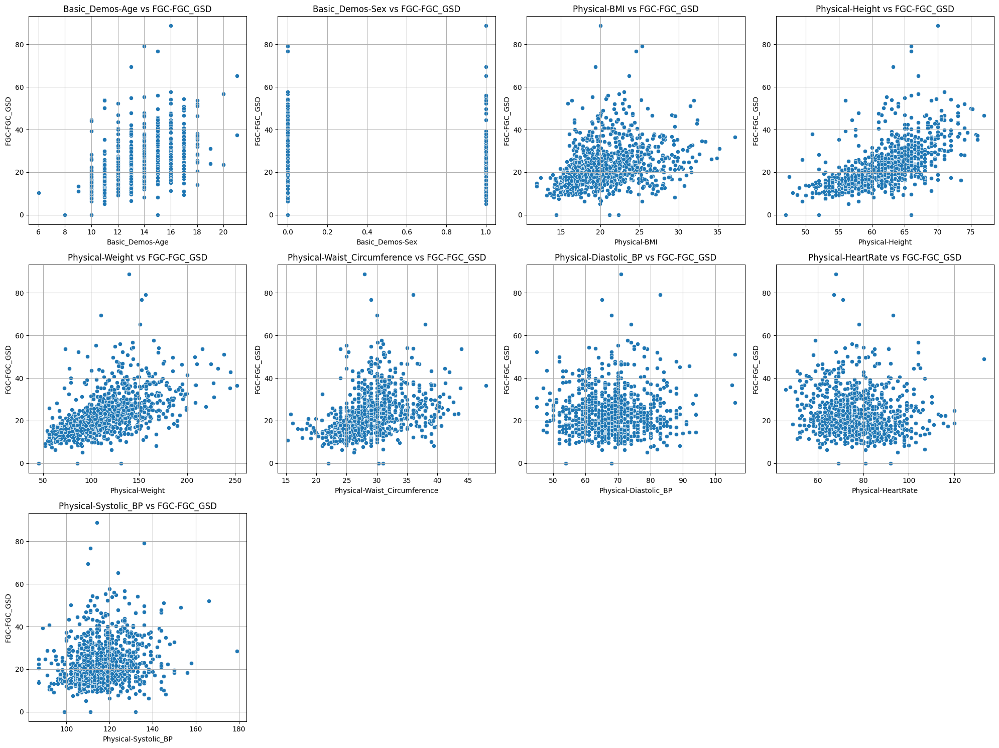

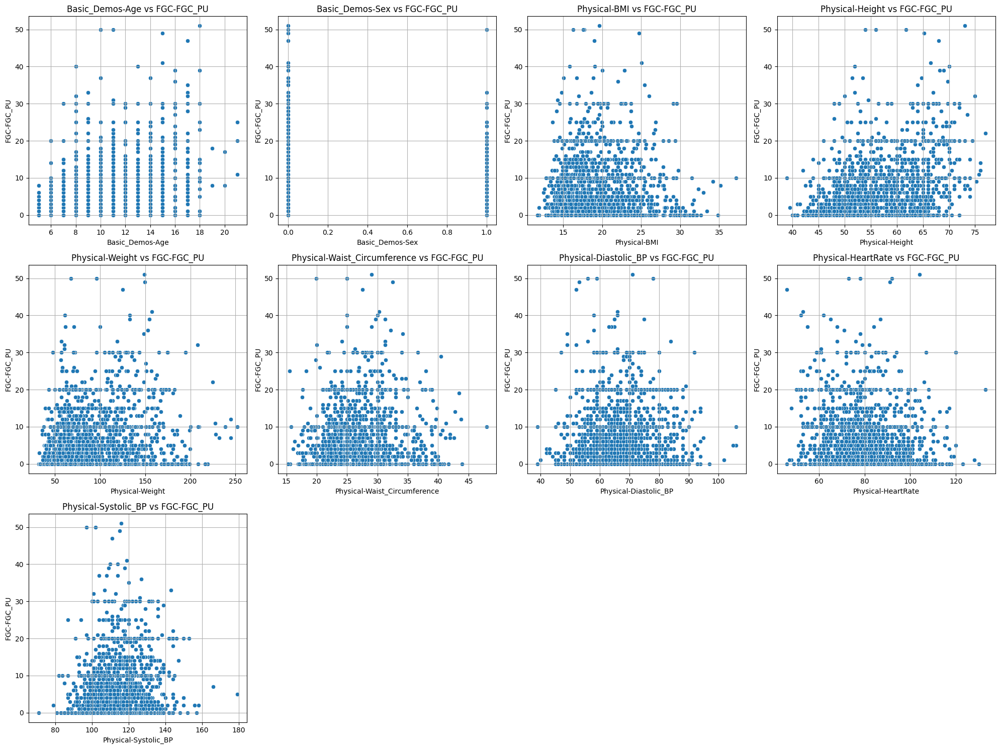

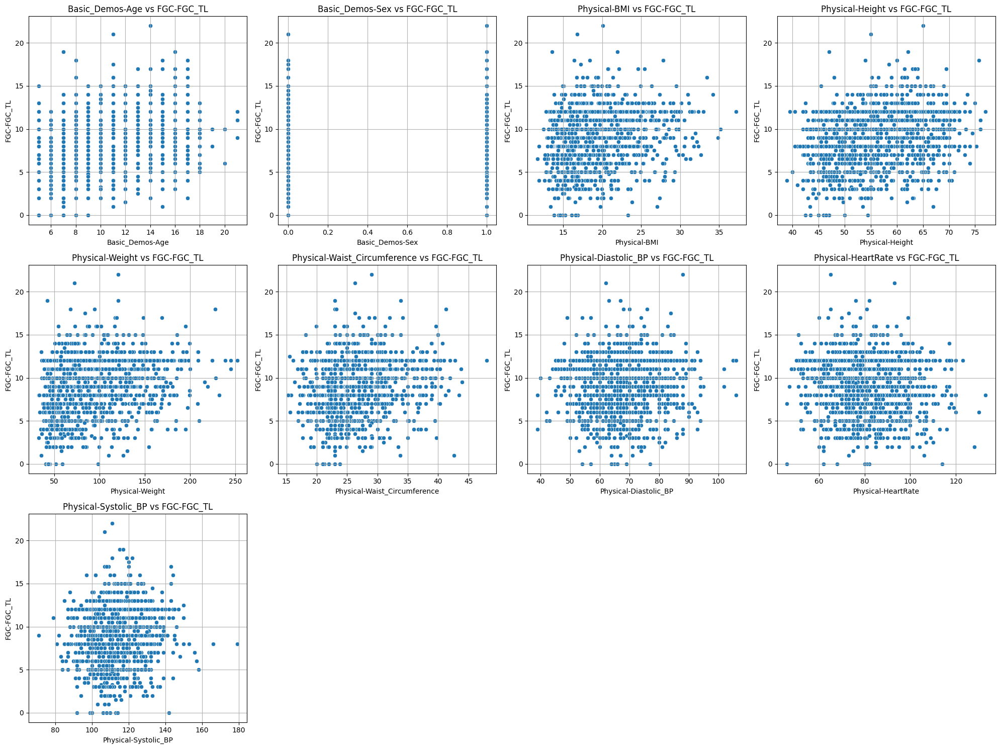

In [212]:
for col in columns_of_interest:
    scatter_plots(low_null_cols, col, train_df)

Lets see if we can possibly use regression for value imputing

In [213]:
fgc_training_df = train_df.copy()
fgc_training_df.dropna(subset=columns_of_interest + low_null_cols, inplace=True)
display(fgc_training_df)

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-PCIAT_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,sii
2,00105258,1.0,10.0,1.0,2.0,71.0,2.0,16.648696,56.50,75.6,...,2.0,1.0,1.0,28.0,2.0,38.0,54.0,1.0,2.0,0.0
5,001f3379,0.0,13.0,1.0,3.0,50.0,1.0,22.279952,59.50,112.2,...,1.0,2.0,1.0,34.0,1.0,40.0,56.0,0.0,0.0,1.0
7,0068a485,2.0,10.0,1.0,NaN,NaN,2.0,16.861286,59.25,84.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN
12,00ae59c9,2.0,13.0,0.0,NaN,NaN,3.0,21.079065,57.75,100.0,...,2.0,2.0,1.0,31.0,2.0,33.0,47.0,2.0,1.0,1.0
13,00af6387,0.0,12.0,0.0,NaN,NaN,0.0,15.544111,60.00,79.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3944,fe7f68a7,0.0,15.0,1.0,NaN,NaN,0.0,22.457960,62.00,122.8,...,NaN,NaN,NaN,NaN,0.0,49.0,68.0,0.0,2.0,NaN
3946,feb53635,3.0,14.0,0.0,1.0,70.0,0.0,19.036779,69.50,130.8,...,4.0,4.0,4.0,77.0,0.0,51.0,71.0,3.0,3.0,2.0
3949,fefaffe0,0.0,12.0,1.0,1.0,80.0,0.0,22.348231,62.00,122.2,...,0.0,0.0,0.0,7.0,0.0,30.0,43.0,0.0,0.0,0.0
3955,ff8a2de4,2.0,13.0,0.0,0.0,60.0,2.0,16.362460,59.50,82.4,...,1.0,1.0,0.0,32.0,3.0,35.0,50.0,2.0,1.0,1.0


In [214]:
for col in columns_of_interest:
    print(f"===== {col} =====")
    X = fgc_training_df[['Basic_Demos-Age', 'Physical-Height', 'Physical-Weight', 'Physical-Waist_Circumference']].values
    y = fgc_training_df[col].values

    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    results = []

    for model_name, model in regression_models.items():
        model.fit(X_train, y_train)
        y_val_pred = model.predict(X_val)
        val_mse = mean_squared_error(y_val, y_val_pred)
        val_r2 = r2_score(y_val, y_val_pred)
        y_test_pred = model.predict(X_test)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_r2 = r2_score(y_test, y_test_pred)
        
        results.append({
            'Model': model_name,
            'Validation MSE': val_mse,
            'Validation R²': val_r2,
            'Test MSE': test_mse,
            'Test R²': test_r2
        })

    results_df = pd.DataFrame(results)
    display(results_df)

===== FGC-FGC_CU =====


,Model,Validation MSE,Validation R²,Test MSE,Test R²
0,Linear Regression,167.205871,0.113328,130.747369,0.131210
1,Ridge Regression,167.205181,0.113332,130.746444,0.131216
2,Lasso Regression,167.322781,0.112708,130.007082,0.136129
3,Decision Tree Regressor,277.218579,-0.470055,298.251366,-0.981821
4,Random Forest Regressor,180.222578,0.044302,160.793922,-0.068444
5,Gradient Boosting Regressor,178.070783,0.055713,144.074337,0.042655
6,K-Nearest Neighbors Regressor,187.433005,0.006066,182.112131,-0.210099
7,Support Vector Regressor,186.845775,0.009180,149.937059,0.003698


===== FGC-FGC_GSND =====


,Model,Validation MSE,Validation R²,Test MSE,Test R²
0,Linear Regression,56.943568,0.362121,57.495487,0.406642
1,Ridge Regression,56.942710,0.362131,57.493644,0.406661
2,Lasso Regression,56.724603,0.364574,56.565970,0.416235
3,Decision Tree Regressor,97.164018,-0.088427,119.506393,-0.233315
4,Random Forest Regressor,62.650409,0.298193,67.448095,0.303931
5,Gradient Boosting Regressor,60.189712,0.325758,58.292515,0.398417
6,K-Nearest Neighbors Regressor,71.138650,0.203108,71.024604,0.267021
7,Support Vector Regressor,62.316767,0.301931,61.342895,0.366937


===== FGC-FGC_GSD =====


,Model,Validation MSE,Validation R²,Test MSE,Test R²
0,Linear Regression,62.560606,0.393226,71.887619,0.398052
1,Ridge Regression,62.560103,0.393231,71.884947,0.398074
2,Lasso Regression,62.749924,0.391390,70.885381,0.406444
3,Decision Tree Regressor,95.421952,0.074505,174.307771,-0.459560
4,Random Forest Regressor,67.960429,0.340853,86.208728,0.278134
5,Gradient Boosting Regressor,67.258148,0.347665,80.040827,0.329781
6,K-Nearest Neighbors Regressor,76.383536,0.259158,84.138598,0.295469
7,Support Vector Regressor,71.679463,0.304783,78.565096,0.342138


===== FGC-FGC_PU =====


,Model,Validation MSE,Validation R²,Test MSE,Test R²
0,Linear Regression,82.070726,0.088597,75.763333,0.053136
1,Ridge Regression,82.070969,0.088594,75.761490,0.053159
2,Lasso Regression,82.906928,0.079311,75.560549,0.055671
3,Decision Tree Regressor,126.765027,-0.407737,127.765027,-0.596762
4,Random Forest Regressor,91.637668,-0.017645,79.057510,0.011967
5,Gradient Boosting Regressor,85.870253,0.046403,81.086235,-0.013387
6,K-Nearest Neighbors Regressor,88.092459,0.021725,83.254645,-0.040487
7,Support Vector Regressor,96.928646,-0.076401,98.760099,-0.234269


===== FGC-FGC_TL =====


,Model,Validation MSE,Validation R²,Test MSE,Test R²
0,Linear Regression,7.768104,-0.008336,7.556300,-0.038611
1,Ridge Regression,7.768068,-0.008331,7.556252,-0.038605
2,Lasso Regression,7.662125,0.005421,7.421220,-0.020044
3,Decision Tree Regressor,15.945464,-1.069794,17.195355,-1.363496
4,Random Forest Regressor,9.025566,-0.171560,8.652642,-0.189303
5,Gradient Boosting Regressor,8.445062,-0.096208,8.471252,-0.164371
6,K-Nearest Neighbors Regressor,9.431869,-0.224300,8.856321,-0.217299
7,Support Vector Regressor,8.383204,-0.088178,7.357518,-0.011289


Regression won't be possible with the columns that we have low null values.

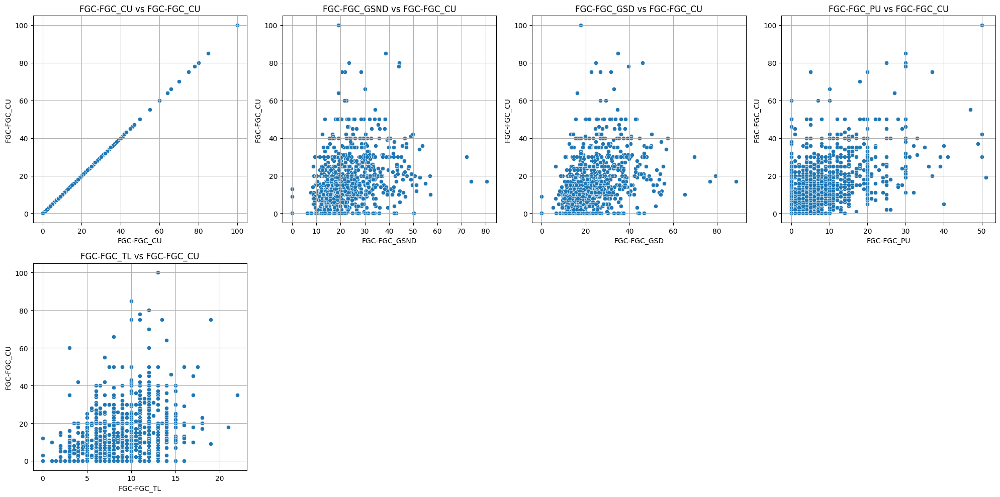

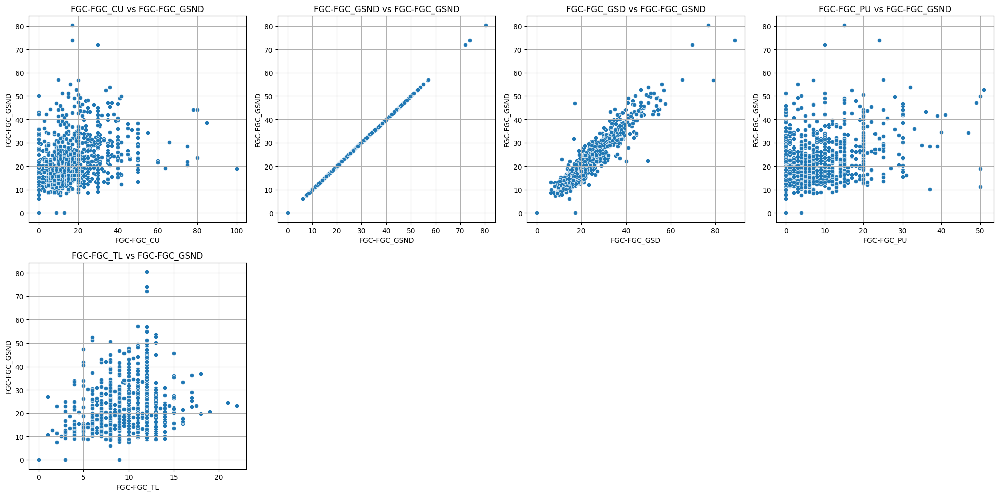

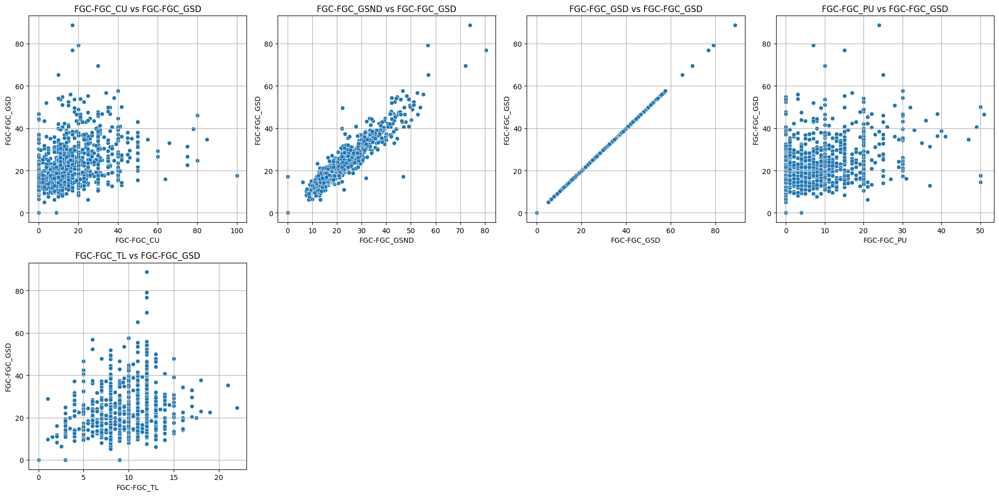

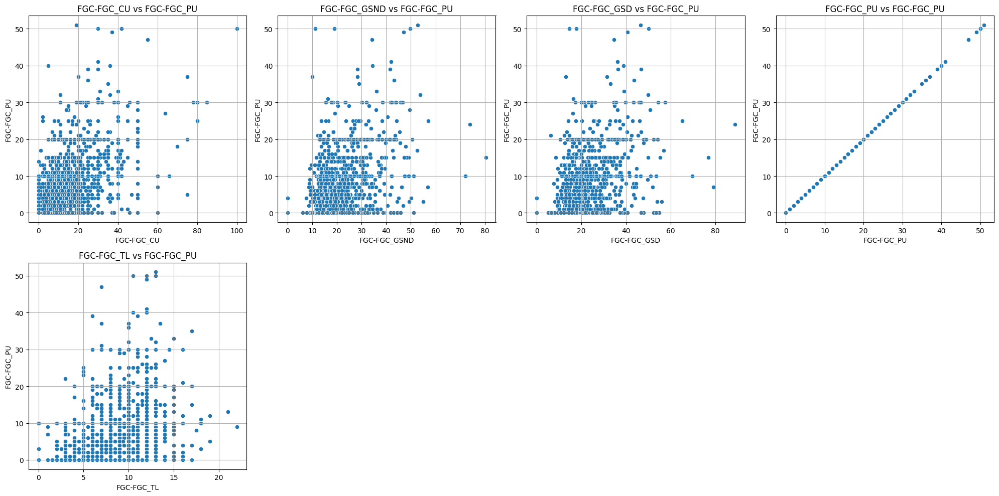

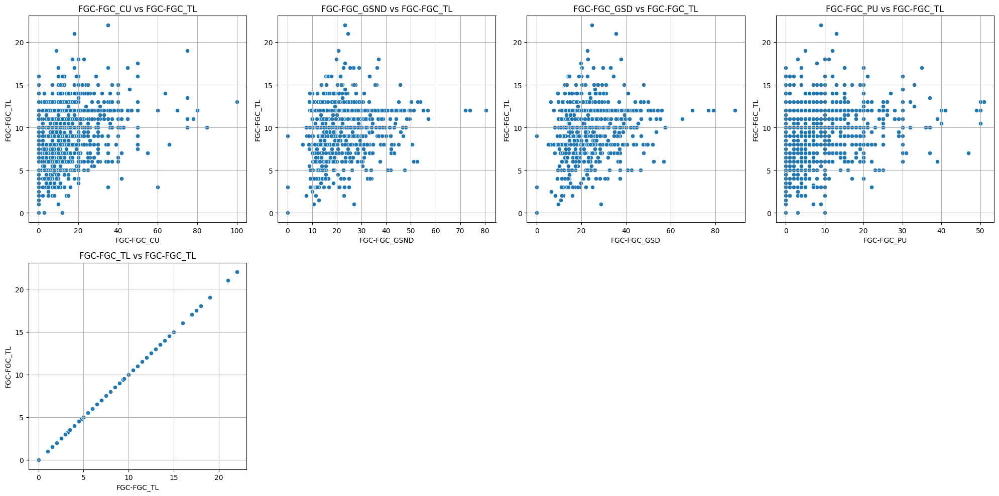

In [215]:
for col in columns_of_interest:
    scatter_plots(columns_of_interest, col, train_df)

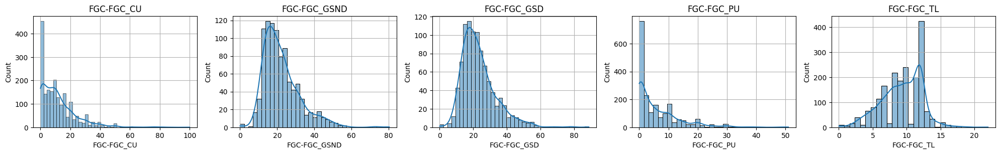

In [216]:
hist_plots(train_df, columns_of_interest)

In [217]:
for col in columns_of_interest:
    print(f"===== {col} =====")
    group = train_df.groupby('Basic_Demos-Age')[col]
    display(group.describe())
    display(group.median())

===== FGC-FGC_CU =====


,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,72.0,1.236111,2.469493,0.0,0.00,0.0,2.00,13.0
6.0,171.0,3.140351,3.799870,0.0,0.00,2.0,5.00,20.0
7.0,183.0,5.213115,5.272096,0.0,0.00,4.0,8.00,26.0
8.0,248.0,6.995968,6.630501,0.0,1.00,6.0,10.00,37.0
9.0,216.0,8.402778,7.090760,0.0,3.00,7.0,11.00,43.0
10.0,216.0,12.259259,12.192159,0.0,5.00,10.0,17.00,100.0
11.0,156.0,13.826923,10.700717,0.0,7.00,12.5,19.25,50.0
12.0,160.0,14.950000,10.767293,0.0,7.00,13.0,20.00,50.0
13.0,130.0,18.107692,13.901228,0.0,10.00,15.0,23.75,80.0


Basic_Demos-Age
5.0      0.0
6.0      2.0
7.0      4.0
8.0      6.0
9.0      7.0
10.0    10.0
11.0    12.5
12.0    13.0
13.0    15.0
14.0    18.0
15.0    18.0
16.0    19.5
17.0    16.5
18.0    19.0
19.0    14.0
20.0    37.0
21.0    20.0
22.0     NaN
Name: FGC-FGC_CU, dtype: float64

===== FGC-FGC_GSND =====


,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6.0,1.0,12.800000,NaN,12.8,12.800,12.80,12.800,12.8
7.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8.0,1.0,0.000000,NaN,0.0,0.000,0.00,0.000,0.0
9.0,2.0,12.900000,0.282843,12.7,12.800,12.90,13.000,13.1
10.0,122.0,14.609016,5.987977,0.0,11.700,13.60,15.775,50.2
11.0,153.0,17.650980,6.692318,7.5,13.700,16.30,19.300,49.8
12.0,159.0,18.975472,6.480933,8.5,14.750,17.80,21.900,46.2
13.0,130.0,22.194615,8.550174,0.0,16.650,21.70,26.000,72.0


Basic_Demos-Age
5.0       NaN
6.0     12.80
7.0       NaN
8.0      0.00
9.0     12.90
10.0    13.60
11.0    16.30
12.0    17.80
13.0    21.70
14.0    23.65
15.0    26.90
16.0    25.90
17.0    28.60
18.0    30.30
19.0    26.05
20.0    40.20
21.0    40.00
22.0      NaN
Name: FGC-FGC_GSND, dtype: float64

===== FGC-FGC_GSD =====


,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6.0,1.0,10.400000,NaN,10.4,10.400,10.40,10.400,10.4
7.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8.0,1.0,0.000000,NaN,0.0,0.000,0.00,0.000,0.0
9.0,2.0,12.200000,1.555635,11.1,11.650,12.20,12.750,13.3
10.0,122.0,15.562213,6.030557,0.0,12.375,14.70,17.450,44.4
11.0,155.0,17.941935,6.654691,5.1,14.450,17.10,20.050,54.0
12.0,159.0,19.785912,6.967090,9.1,15.500,18.30,22.550,52.4
13.0,130.0,23.404615,8.421170,6.5,18.325,22.90,26.650,69.6


Basic_Demos-Age
5.0       NaN
6.0     10.40
7.0       NaN
8.0      0.00
9.0     12.20
10.0    14.70
11.0    17.10
12.0    18.30
13.0    22.90
14.0    25.20
15.0    28.75
16.0    27.30
17.0    30.10
18.0    35.75
19.0    27.50
20.0    40.15
21.0    37.40
22.0      NaN
Name: FGC-FGC_GSD, dtype: float64

===== FGC-FGC_PU =====


,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,72.0,0.819444,1.762891,0.0,0.00,0.0,1.00,8.0
6.0,170.0,1.564706,3.511425,0.0,0.00,0.0,1.00,20.0
7.0,182.0,3.302198,4.510503,0.0,0.00,2.0,5.00,30.0
8.0,247.0,4.165992,5.966095,0.0,0.00,2.0,6.50,40.0
9.0,216.0,5.300926,6.085988,0.0,0.00,3.0,9.00,33.0
10.0,216.0,6.254630,7.720403,0.0,0.75,4.0,10.00,50.0
11.0,155.0,6.974194,7.877263,0.0,0.00,5.0,11.00,50.0
12.0,158.0,6.803797,7.249387,0.0,0.00,5.0,10.00,30.0
13.0,130.0,7.661538,7.959738,0.0,1.00,6.0,11.75,40.0


Basic_Demos-Age
5.0      0.0
6.0      0.0
7.0      2.0
8.0      2.0
9.0      3.0
10.0     4.0
11.0     5.0
12.0     5.0
13.0     6.0
14.0     7.5
15.0     6.0
16.0     8.0
17.0    10.0
18.0    10.0
19.0    13.0
20.0    12.5
21.0    20.0
22.0     NaN
Name: FGC-FGC_PU, dtype: float64

===== FGC-FGC_TL =====


,count,mean,std,min,25%,50%,75%,max
Basic_Demos-Age,,,,,,,,
5.0,72.0,7.951389,3.209975,0.0,6.375,8.0,10.0,15.0
6.0,172.0,7.587209,2.688172,0.0,6.000,8.0,10.0,12.0
7.0,183.0,8.173497,3.095818,0.0,6.000,8.0,10.0,19.0
8.0,248.0,9.008065,2.782961,0.0,7.000,9.0,11.0,18.0
9.0,216.0,9.153935,2.773374,0.0,7.375,10.0,12.0,15.0
10.0,216.0,9.255787,2.867971,2.0,7.000,10.0,12.0,15.0
11.0,156.0,10.320513,3.040558,1.0,8.000,11.0,12.0,21.0
12.0,160.0,9.765625,2.725331,1.5,8.000,10.5,12.0,15.0
13.0,130.0,10.026923,2.859305,2.5,8.000,11.0,12.0,17.0


Basic_Demos-Age
5.0      8.0
6.0      8.0
7.0      8.0
8.0      9.0
9.0     10.0
10.0    10.0
11.0    11.0
12.0    10.5
13.0    11.0
14.0    11.0
15.0    11.0
16.0    11.0
17.0    10.5
18.0    10.5
19.0     9.0
20.0     8.0
21.0    11.0
22.0     NaN
Name: FGC-FGC_TL, dtype: float64

#### Imputing
Seeing that filling with a model would not be possible, but there is a pattern for median values based on the age group. We will impute the NaN values with median value and see how it does

In [218]:
for col in columns_of_interest:
    for age in age_groups:
        age_group_df = train_df[train_df['Basic_Demos-Age'] == age].dropna(subset=[col])
        if len(age_group_df) < 20:
            continue
        Q1 = age_group_df[col].quantile(0.25)
        Q3 = age_group_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        filtered_df = age_group_df[(age_group_df[col] >= lower_bound) & (age_group_df[col] <= upper_bound)]
        median_value = filtered_df[col].median()
        train_df.loc[train_df['Basic_Demos-Age'] == age, col] = train_df.loc[train_df['Basic_Demos-Age'] == age, col].fillna(median_value)
        train_df = train_df[~((train_df['Basic_Demos-Age'] == age) & ((train_df[col] < lower_bound) | (train_df[col] > upper_bound)))]

In [219]:
for col in columns_of_interest:
    get_null_percentage(col, train_df)

Null percentage for FGC-FGC_CU: 2.50
Null percentage for FGC-FGC_GSND: 47.87
Null percentage for FGC-FGC_GSD: 49.38
Null percentage for FGC-FGC_PU: 4.04
Null percentage for FGC-FGC_TL: 4.01


### Post cleanup correlation

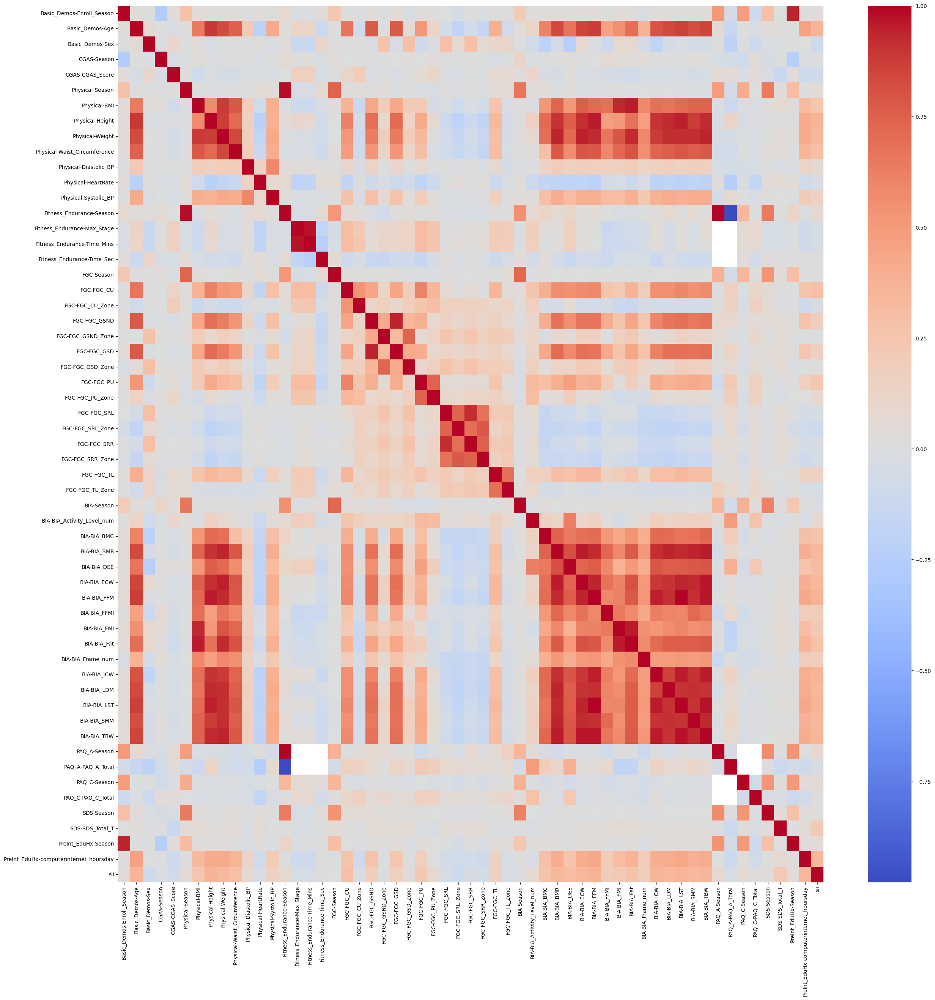

In [220]:
temp = train_df.copy()
temp.drop(columns=temp.filter(regex='^PCIAT').columns, inplace=True)
temp.drop(['id', 'SDS-SDS_Total_Raw'], axis=1, inplace=True)
correlation_matrix = temp.corr()
plt.figure(figsize=(30, 30))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.show()

# Preparing a dataset

## Actigraphy dataset

In [221]:
actigraphy_df = pd.read_parquet("series_train.parquet")

In [222]:
# Removing irrelevant columns
actigraphy_df.drop(
    columns=["step", "X", "Y", "Z", "anglez", "battery_voltage"],
    inplace=True,
)

In [223]:
# Adding mean, median, and std columns
agg_funcs = {
    "enmo": ["mean", "std"],
    "non-wear_flag": ["mean", "std"],
    "light": ["mean", "std"]
}

actigraphy_df = actigraphy_df.groupby("id", observed=True).agg(agg_funcs)
actigraphy_df.columns = ['_'.join(col).strip() for col in actigraphy_df.columns.values]
actigraphy_df.reset_index(inplace=True)
display(actigraphy_df)

,id,enmo_mean,enmo_std,non-wear_flag_mean,non-wear_flag_std,light_mean,light_std
0,00115b9f,0.047388,0.106351,0.000000,0.000000,42.296310,208.168976
1,001f3379,0.011926,0.024331,0.655708,0.468723,16.771980,95.327438
2,00f332d1,0.030255,0.104136,0.171246,0.374121,66.563393,286.916595
3,01085eb3,0.032946,0.083798,0.035210,0.183652,17.800735,73.023468
4,012cadd8,0.058280,0.197285,0.000000,0.000000,54.893402,230.972397
...,...,...,...,...,...,...,...
991,fe9c71d8,0.043686,0.103688,0.137257,0.340731,7.297878,33.701969
992,fecc07d6,0.002962,0.012999,0.939101,0.231608,50.648312,86.377480
993,ff18b749,0.053595,0.142568,0.000000,0.000000,94.217117,312.745941
994,ffcd4dbd,0.028601,0.072386,0.020323,0.139045,22.480034,110.340538


In [224]:
actigraphy_df.columns

Index(['id', 'enmo_mean', 'enmo_std', 'non-wear_flag_mean',
       'non-wear_flag_std', 'light_mean', 'light_std'],
      dtype='object')

In [225]:
# # Taking means after aggregations
# actigraphy_df = actigraphy_df.groupby("id", observed=True).agg(
#     {"enmo": "mean", "non-wear_flag": "mean", "light": "mean"}
# )

# actigraphy_df.reset_index(inplace=True)
# display(actigraphy_df)

## HBN dataset

In [226]:
hbn_df = pd.read_csv("train.csv")

In [227]:
# Converting seasons to numeric values
season_mapping = {"Spring": 0, "Summer": 1, "Fall": 2, "Winter": 3}
season_cols = hbn_df.filter(regex="Season$").columns
hbn_df[season_cols] = hbn_df[season_cols].replace(season_mapping)

/var/folders/zx/vckbd4yn4t7bb1hlf2w83w5c0000gn/T/ipykernel_15303/2726629741.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  hbn_df[season_cols] = hbn_df[season_cols].replace(season_mapping)


### Valid range

In [228]:
valid_ranges = {
    'Basic_Demos-Enroll_Season': (0, 3),
    'Basic_Demos-Age': (0, 120),
    'Basic_Demos-Sex': (0, 1),
    'CGAS-Season': (0, 3),
    'CGAS-CGAS_Score': (0, 100),
    'Physical-Season': (0, 3),
    'Physical-BMI': (10, 60),
    'Physical-Height': (30, 250),
    'Physical-Weight': (2, 300),
    'Physical-Waist_Circumference': (10, 200),
    'Physical-Diastolic_BP': (30, 120),
    'Physical-HeartRate': (30, 200),
    'Physical-Systolic_BP': (50, 250),
    'Fitness_Endurance-Season': (0, 3),
    'Fitness_Endurance-Max_Stage': (0, 20),
    'Fitness_Endurance-Time_Mins': (0, 60),
    'Fitness_Endurance-Time_Sec': (0, 60),
    'FGC-Season': (0, 3),
    'FGC-FGC_CU': (0, 100),
    'FGC-FGC_CU_Zone': (0, 3),
    'FGC-FGC_GSND': (0, 100),
    'FGC-FGC_GSND_Zone': (0, 3),
    'FGC-FGC_GSD': (0, 100),
    'FGC-FGC_GSD_Zone': (0, 3),
    'FGC-FGC_PU': (0, 100),
    'FGC-FGC_PU_Zone': (0, 3),
    'FGC-FGC_SRL': (0, 100),
    'FGC-FGC_SRL_Zone': (0, 3),
    'FGC-FGC_SRR': (0, 100),
    'FGC-FGC_SRR_Zone': (0, 3),
    'FGC-FGC_TL': (0, 100),
    'FGC-FGC_TL_Zone': (0, 3),
    'BIA-Season': (0, 3),
    'BIA-BIA_Activity_Level_num': (0, 5),
    'BIA-BIA_BMC': (0, 10),
    'BIA-BIA_BMI': (10, 60),
    'BIA-BIA_BMR': (500, 3000),
    'BIA-BIA_DEE': (1000, 5000),
    'BIA-BIA_ECW': (0, 50),
    'BIA-BIA_FFM': (0, 100),
    'BIA-BIA_FFMI': (0, 50),
    'BIA-BIA_FMI': (0, 50),
    'BIA-BIA_Fat': (0, 100),
    'BIA-BIA_Frame_num': (0, 5),
    'BIA-BIA_ICW': (0, 50),
    'BIA-BIA_LDM': (0, 50),
    'BIA-BIA_LST': (0, 100),
    'BIA-BIA_SMM': (0, 100),
    'BIA-BIA_TBW': (0, 100),
    'PAQ_A-Season': (0, 3),
    'PAQ_A-PAQ_A_Total': (0, 10),
    'PAQ_C-Season': (0, 3),
    'PAQ_C-PAQ_C_Total': (0, 10),
    'PCIAT-Season': (0, 3),
    'PCIAT-PCIAT_01': (0, 5),
    'PCIAT-PCIAT_02': (0, 5),
    'PCIAT-PCIAT_03': (0, 5),
    'PCIAT-PCIAT_04': (0, 5),
    'PCIAT-PCIAT_05': (0, 5),
    'PCIAT-PCIAT_06': (0, 5),
    'PCIAT-PCIAT_07': (0, 5),
    'PCIAT-PCIAT_08': (0, 5),
    'PCIAT-PCIAT_09': (0, 5),
    'PCIAT-PCIAT_10': (0, 5),
    'PCIAT-PCIAT_11': (0, 5),
    'PCIAT-PCIAT_12': (0, 5),
    'PCIAT-PCIAT_13': (0, 5),
    'PCIAT-PCIAT_14': (0, 5),
    'PCIAT-PCIAT_15': (0, 5),
    'PCIAT-PCIAT_16': (0, 5),
    'PCIAT-PCIAT_17': (0, 5),
    'PCIAT-PCIAT_18': (0, 5),
    'PCIAT-PCIAT_19': (0, 5),
    'PCIAT-PCIAT_20': (0, 5),
    'PCIAT-PCIAT_Total': (0, 100),
    'SDS-Season': (0, 3),
    'SDS-SDS_Total_Raw': (0, 100),
    'SDS-SDS_Total_T': (0, 100),
    'PreInt_EduHx-Season': (0, 3),
    'PreInt_EduHx-computerinternet_hoursday': (0, 24),
    'sii': (0, 3)
}

for column, (min_val, max_val) in valid_ranges.items():
    hbn_df.loc[(hbn_df[column] < min_val) | (hbn_df[column] > max_val), column] = np.nan

In [229]:
# As sii column is calculated from PCIAT Total and that is calculated from PCIAT questions, we can drop all PCIAT columns. We will only keep the season column
columns_to_drop = hbn_df.filter(regex="^PCIAT").columns.difference(["PCIAT-Season"])
hbn_df.drop(columns=columns_to_drop, inplace=True)

In [230]:
age_groups = sorted(hbn_df['Basic_Demos-Age'].unique().tolist())

### BMI

In [231]:
hbn_df['Physical-BMI'] = hbn_df['Physical-BMI'].fillna(hbn_df['BIA-BIA_BMI'])

In [232]:
# That did not make a huge difference so we will drop one of the columns and will the value in a different way
hbn_df.drop(columns=['BIA-BIA_BMI'], inplace=True)

In [233]:
column_of_interest = 'Physical-BMI'
for age in age_groups:
    age_group_df = hbn_df[hbn_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest] = hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    hbn_df = hbn_df[~((hbn_df['Basic_Demos-Age'] == age) & ((hbn_df[column_of_interest] < lower_bound) | (hbn_df[column_of_interest] > upper_bound)))]

### BIA

In [234]:
columns_of_interest = hbn_df.filter(regex='^BIA').columns.to_list()
columns_of_interest.remove('BIA-Season')
columns_of_interest.remove('BIA-BIA_Activity_Level_num')
columns_of_interest.remove('BIA-BIA_Frame_num')
bia_corr_columns = ['Basic_Demos-Age', 'Physical-BMI', 'Physical-Height', 'Physical-Weight']

In [235]:
results = {}
for col in columns_of_interest:
    training_df = hbn_df.copy().dropna(subset=[col] + bia_corr_columns)

    X = training_df[bia_corr_columns].values
    y = training_df[col].values

    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    results[col] = []

    for model_name, model in regression_models.items():
        model.fit(X_train, y_train)
        y_val_pred = model.predict(X_val)
        val_mse = mean_squared_error(y_val, y_val_pred)
        val_r2 = r2_score(y_val, y_val_pred)
        y_test_pred = model.predict(X_test)
        test_mse = mean_squared_error(y_test, y_test_pred)
        test_r2 = r2_score(y_test, y_test_pred)
        
        results[col].append({
            'Model': model_name,
            'Validation MSE': val_mse,
            'Validation R²': val_r2,
            'Test MSE': test_mse,
            'Test R²': test_r2
        })

best_models = {}
for col, result in results.items():
    best_model = max(result, key=lambda x: (x['Validation R²'], x['Test R²']))
    if best_model['Validation R²'] > 0.7 and best_model['Test R²'] > 0.7:
        best_models[col] = best_model['Model']

for col, best_model in best_models.items():
    print(f"Column: {col}, Model: {best_model}")
    training_df = hbn_df.copy().dropna(subset=[col] + bia_corr_columns)

    prediction_df = hbn_df[hbn_df[col].isnull()]
    prediction_df = prediction_df.dropna(subset=bia_corr_columns)

    X = training_df[bia_corr_columns].values
    y = training_df[col].values

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = regression_models[best_model]
    model.fit(X_train, y_train)
    print(f"Score: {model.score(X_test, y_test)}")

    for index, row in prediction_df.iterrows():
        X = row[bia_corr_columns].values.reshape(1, -1)
        prediction = model.predict(X)
        hbn_df.loc[index, col] = prediction

Column: BIA-BIA_BMR, Model: Lasso Regression
Score: 0.8976876365422236
Column: BIA-BIA_ECW, Model: Linear Regression
Score: 0.9014181157084104
Column: BIA-BIA_FFM, Model: Gradient Boosting Regressor
Score: 0.9344412554900656
Column: BIA-BIA_Fat, Model: Gradient Boosting Regressor
Score: 0.8989724953151488
Column: BIA-BIA_ICW, Model: Gradient Boosting Regressor
Score: 0.7457505355768813
Column: BIA-BIA_LDM, Model: Ridge Regression
Score: 0.8892592612722048
Column: BIA-BIA_LST, Model: Gradient Boosting Regressor
Score: 0.9297527218981899
Column: BIA-BIA_SMM, Model: Lasso Regression
Score: 0.7940393975924847
Column: BIA-BIA_TBW, Model: Linear Regression
Score: 0.9078853946345324


### Waist

In [236]:
# Getting correlation columns
correlation_matrix = hbn_df.drop(columns=['id']).corr()
waist_corr = correlation_matrix['Physical-Waist_Circumference']
waist_corr_columns = waist_corr[waist_corr.abs() > 0.5].index.tolist()
waist_corr_columns.remove('Physical-Waist_Circumference')
waist_corr_columns.remove('BIA-BIA_DEE')
waist_corr_columns.remove('BIA-BIA_FFMI')
waist_corr_columns.remove('Physical-BMI')

In [237]:
training_df = hbn_df.copy()
training_df.dropna(subset=waist_corr_columns + ['Physical-Waist_Circumference'], inplace=True)
prediction_df = hbn_df[hbn_df['Physical-Waist_Circumference'].isnull()].dropna(subset=waist_corr_columns)

In [238]:
X = training_df[waist_corr_columns].values
y = training_df['Physical-Waist_Circumference'].values

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [239]:
results = []

for model_name, model in regression_models.items():
    model.fit(X_train, y_train)
    y_val_pred = model.predict(X_val)
    val_mse = mean_squared_error(y_val, y_val_pred)
    val_r2 = r2_score(y_val, y_val_pred)
    y_test_pred = model.predict(X_test)
    test_mse = mean_squared_error(y_test, y_test_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    
    results.append({
        'Model': model_name,
        'Validation MSE': val_mse,
        'Validation R²': val_r2,
        'Test MSE': test_mse,
        'Test R²': test_r2
    })

results_df = pd.DataFrame(results)
display(results_df)

,Model,Validation MSE,Validation R²,Test MSE,Test R²
0,Linear Regression,2.472843,0.879201,2.813449,0.886154
1,Ridge Regression,2.464160,0.879625,2.802868,0.886582
2,Lasso Regression,2.792677,0.863577,3.050352,0.876568
3,Decision Tree Regressor,5.247449,0.743660,6.214286,0.748539
4,Random Forest Regressor,2.629648,0.871541,3.566463,0.855683
5,Gradient Boosting Regressor,2.920641,0.857326,3.694742,0.850492
6,K-Nearest Neighbors Regressor,4.058061,0.801762,5.258367,0.787220
7,Support Vector Regressor,6.529488,0.681032,8.532761,0.654722


In [240]:
best_model = results_df.loc[results_df['Test R²'].idxmax() & results_df['Validation R²'].idxmax()]
print("\nBest Model:")
print(best_model)


Best Model:
Model             Ridge Regression
Validation MSE             2.46416
Validation R²             0.879625
Test MSE                  2.802868
Test R²                   0.886582
Name: 1, dtype: object


In [241]:
model = regression_models[best_model['Model']]
model.fit(X_train, y_train)

Ridge()

In [242]:
for index, row in prediction_df.iterrows():
    X = row[waist_corr_columns].values.reshape(1, -1)
    waist = model.predict(X)
    hbn_df.loc[index, 'Physical-Waist_Circumference'] = waist

In [243]:
column_of_interest = 'Physical-Waist_Circumference'
for age in age_groups:
    age_group_df = hbn_df[hbn_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest] = hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    hbn_df = hbn_df[~((hbn_df['Basic_Demos-Age'] == age) & ((hbn_df[column_of_interest] < lower_bound) | (hbn_df[column_of_interest] > upper_bound)))]

### Diastolic and Systolic

In [244]:
# Setting the missing values to the median of the age group and dropping outliers
column_of_interest = 'Physical-Diastolic_BP'
for age in age_groups:
    age_group_df = hbn_df[hbn_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest] = hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    hbn_df = hbn_df[~((hbn_df['Basic_Demos-Age'] == age) & ((hbn_df[column_of_interest] < lower_bound) | (hbn_df[column_of_interest] > upper_bound)))]

column_of_interest = 'Physical-Systolic_BP'
for age in age_groups:
    age_group_df = hbn_df[hbn_df['Basic_Demos-Age'] == age].dropna(subset=[column_of_interest])
    if len(age_group_df) < 20:
        continue
    Q1 = age_group_df[column_of_interest].quantile(0.25)
    Q3 = age_group_df[column_of_interest].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    filtered_df = age_group_df[(age_group_df[column_of_interest] >= lower_bound) & (age_group_df[column_of_interest] <= upper_bound)]
    median_value = filtered_df[column_of_interest].median()
    hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest] = hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, column_of_interest].fillna(median_value)
    hbn_df = hbn_df[~((hbn_df['Basic_Demos-Age'] == age) & ((hbn_df[column_of_interest] < lower_bound) | (hbn_df[column_of_interest] > upper_bound)))]

### FGC

In [245]:
columns_of_interest = ['FGC-FGC_CU', 'FGC-FGC_GSND', 'FGC-FGC_GSD', 'FGC-FGC_PU', 'FGC-FGC_TL']

In [246]:
for col in columns_of_interest:
    for age in age_groups:
        age_group_df = hbn_df[hbn_df['Basic_Demos-Age'] == age].dropna(subset=[col])
        if len(age_group_df) < 20:
            continue
        Q1 = age_group_df[col].quantile(0.25)
        Q3 = age_group_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        filtered_df = age_group_df[(age_group_df[col] >= lower_bound) & (age_group_df[col] <= upper_bound)]
        median_value = filtered_df[col].median()
        hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, col] = hbn_df.loc[hbn_df['Basic_Demos-Age'] == age, col].fillna(median_value)
        hbn_df = hbn_df[~((hbn_df['Basic_Demos-Age'] == age) & ((hbn_df[col] < lower_bound) | (hbn_df[col] > upper_bound)))]

### hbn rest

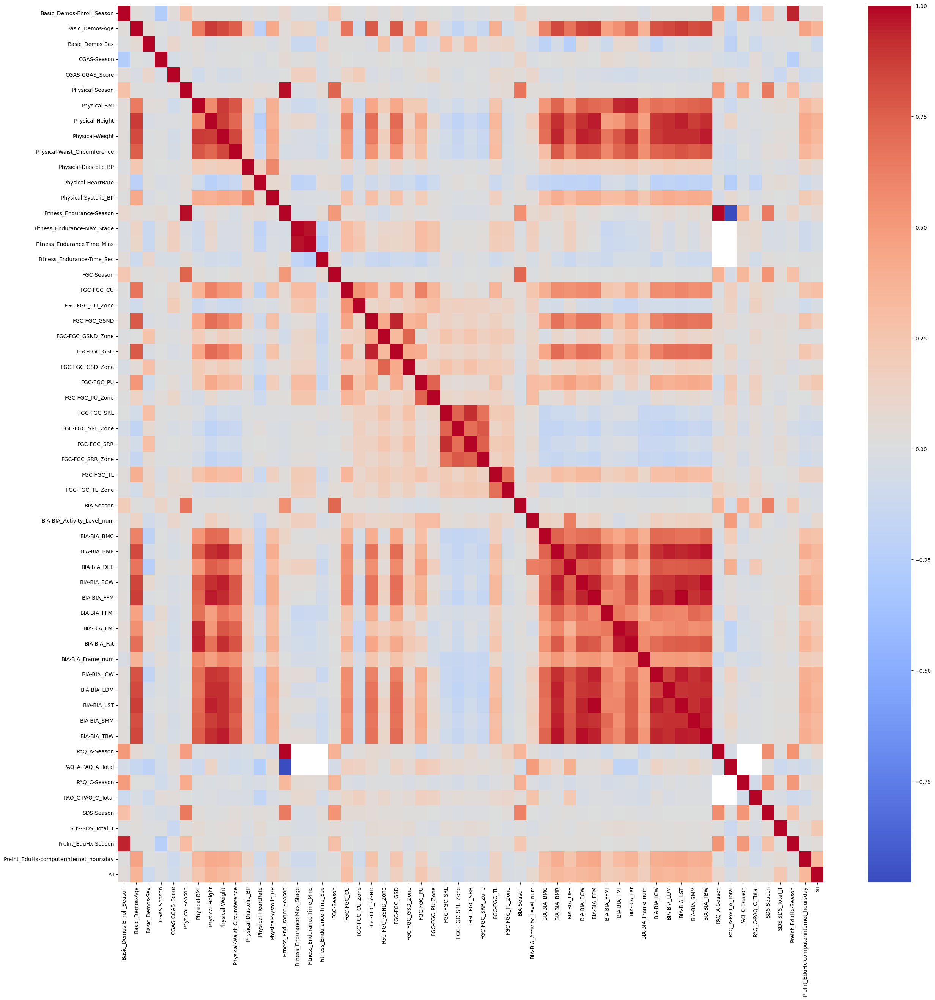

In [247]:
temp = hbn_df.copy()
temp.drop(columns=temp.filter(regex='^PCIAT').columns, inplace=True)
temp.drop(['id', 'SDS-SDS_Total_Raw'], axis=1, inplace=True)
correlation_matrix = temp.corr()
plt.figure(figsize=(30, 30))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.show()

### Feature selection

In [248]:
correlation_matrix = hbn_df.drop(columns=['id']).corr()

sii_corr = correlation_matrix['sii']

sii_corr_columns = sii_corr[sii_corr.abs() > 0.2].index.tolist()
sii_corr_columns.remove('sii')

print("Columns that have correlation with sii:")
print(sii_corr_columns)

Columns that have correlation with sii:
['Basic_Demos-Age', 'Physical-BMI', 'Physical-Height', 'Physical-Weight', 'Physical-Waist_Circumference', 'FGC-FGC_CU', 'FGC-FGC_PU', 'BIA-BIA_BMC', 'BIA-BIA_BMR', 'BIA-BIA_DEE', 'BIA-BIA_ECW', 'BIA-BIA_FFM', 'BIA-BIA_FMI', 'BIA-BIA_Fat', 'BIA-BIA_ICW', 'BIA-BIA_LDM', 'BIA-BIA_LST', 'BIA-BIA_SMM', 'BIA-BIA_TBW', 'SDS-SDS_Total_Raw', 'SDS-SDS_Total_T', 'PreInt_EduHx-computerinternet_hoursday']


In [249]:
# Removing columns that we know are used to calculate others
sii_corr_columns.remove('Physical-Weight')
sii_corr_columns.remove('Physical-Height')
sii_corr_columns.remove('SDS-SDS_Total_Raw')
sii_corr_columns.remove('BIA-BIA_Fat')

In [250]:
hbn_df = hbn_df[sii_corr_columns + ['sii'] + ['id']]

In [251]:
hbn_df.dropna(inplace=True)

In [252]:
def hist_plots(df, cols):
    plt.figure(figsize=(20, 70))
    for i, col in enumerate(cols):
        plt.subplot(25, 5, i + 1)
        sns.histplot(df[col], kde=True)
        plt.xlabel(col)
        plt.title(col)
        plt.grid(True)
        plt.tight_layout()
    plt.show()

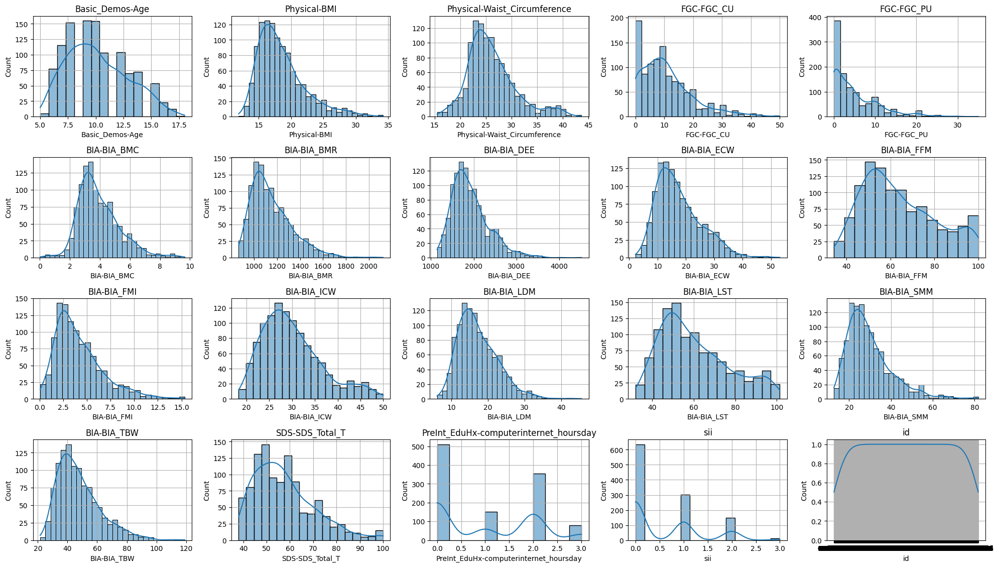

In [253]:
hist_plots(hbn_df, hbn_df.columns)

In [254]:
# We will do log over right skewed columns and then use a scalar over the data
def log_transform(df, col):
    # Replace zero or negative values with a small positive value before applying log
    df[col] = df[col].apply(lambda x: np.log(x) if x > 0 else np.log(1e-9))
    return df

columns_to_transform = ['Physical-BMI', 'Physical-Waist_Circumference', 'BIA-BIA_BMC', 'BIA-BIA_BMR', 'BIA-BIA_DEE',
       'BIA-BIA_ECW', 'BIA-BIA_FMI', 'BIA-BIA_ICW', 'BIA-BIA_LDM', 'BIA-BIA_SMM', 'BIA-BIA_TBW']

for col in columns_to_transform:
    hbn_df = log_transform(hbn_df, col)

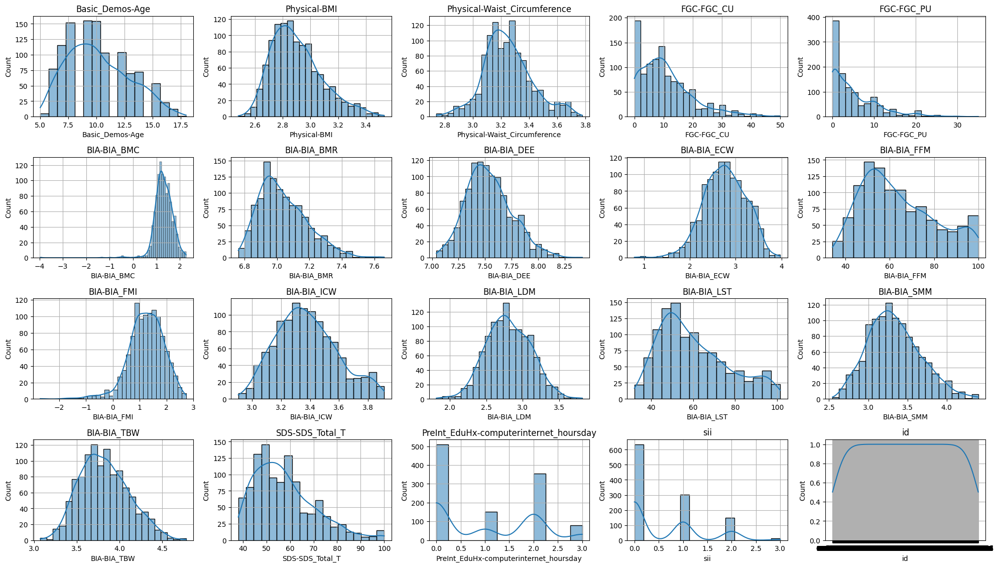

In [255]:
hist_plots(hbn_df, hbn_df.columns)

In [256]:
columns_to_min_max_scale = ['BIA-BIA_FFM', 'BIA-BIA_LST']
columns_to_standard_scale = ['FGC-FGC_CU', 'FGC-FGC_PU']

for col in columns_to_min_max_scale:
    scaler = MinMaxScaler()
    hbn_df[col] = scaler.fit_transform(hbn_df[col].values.reshape(-1, 1))

for col in columns_to_standard_scale:
    scaler = StandardScaler()
    hbn_df[col] = scaler.fit_transform(hbn_df[col].values.reshape(-1, 1))

In [257]:
hbn_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1097 entries, 1 to 3957
Data columns (total 20 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Basic_Demos-Age                         1097 non-null   float64
 1   Physical-BMI                            1097 non-null   float64
 2   Physical-Waist_Circumference            1097 non-null   float64
 3   FGC-FGC_CU                              1097 non-null   float64
 4   FGC-FGC_PU                              1097 non-null   float64
 5   BIA-BIA_BMC                             1097 non-null   float64
 6   BIA-BIA_BMR                             1097 non-null   float64
 7   BIA-BIA_DEE                             1097 non-null   float64
 8   BIA-BIA_ECW                             1097 non-null   float64
 9   BIA-BIA_FFM                             1097 non-null   float64
 10  BIA-BIA_FMI                             1097 non-null   float64
 

### Combining data sources

In [258]:
df = pd.merge(left=hbn_df, right=actigraphy_df, how='left', on='id')

In [259]:
# Filling in missing values

nan_columns = {'enmo_mean',  'enmo_std', 'non-wear_flag_mean', 'non-wear_flag_std', 'light_mean', 'light_std'}

for col in nan_columns:
    df[col] = df[col].fillna(df[col].mean())

In [260]:
df = df.drop(
    columns=["id"]
)

In [261]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1097 entries, 0 to 1096
Data columns (total 25 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Basic_Demos-Age                         1097 non-null   float64
 1   Physical-BMI                            1097 non-null   float64
 2   Physical-Waist_Circumference            1097 non-null   float64
 3   FGC-FGC_CU                              1097 non-null   float64
 4   FGC-FGC_PU                              1097 non-null   float64
 5   BIA-BIA_BMC                             1097 non-null   float64
 6   BIA-BIA_BMR                             1097 non-null   float64
 7   BIA-BIA_DEE                             1097 non-null   float64
 8   BIA-BIA_ECW                             1097 non-null   float64
 9   BIA-BIA_FFM                             1097 non-null   float64
 10  BIA-BIA_FMI                             1097 non-null   floa

# Training and testing models

Train test split

In [262]:
X = df.drop('sii', axis=1)
y = df['sii']

In [263]:
y = y.astype(int)

In [264]:
# For reproducibility
random_state = 42

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=random_state)

Classification models

In [265]:
for model_name, model in classification_models.items():
    # Fit the model
    model.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    print(f"\n=== {model_name} ===")
    print("Accuracy:", accuracy_score(y_test, y_pred))


=== Logistic Regression ===
Accuracy: 0.6272727272727273

=== Decision Tree ===
Accuracy: 0.4818181818181818


/Users/asilins/anaconda3/envs/ML/lib/python3.13/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



=== Random Forest ===
Accuracy: 0.5909090909090909

=== Gradient Boosting ===
Accuracy: 0.5636363636363636

=== K-Nearest Neighbors ===
Accuracy: 0.5727272727272728

=== Support Vector Machine ===
Accuracy: 0.5954545454545455


Regression models

In [266]:
for model_name, model in regression_models.items():
    # Fit the model
    model.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred = model.predict(X_test)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    print(f"\n=== {model_name} ===")
    print("RMSE:", rmse)
    print("R^2 Score:", r2)


=== Linear Regression ===
RMSE: 0.6703686873020327
R^2 Score: 0.25088072455007937

=== Ridge Regression ===
RMSE: 0.6711665725352154
R^2 Score: 0.24909643204781973

=== Lasso Regression ===
RMSE: 0.7588780715062567
R^2 Score: 0.040008166461447

=== Decision Tree Regressor ===
RMSE: 1.0
R^2 Score: -0.6669536765972104

=== Random Forest Regressor ===
RMSE: 0.7058920854944022
R^2 Score: 0.169384260375409

=== Gradient Boosting Regressor ===
RMSE: 0.7053860469721005
R^2 Score: 0.1705747338479202

=== K-Nearest Neighbors Regressor ===
RMSE: 0.7363299655601544
R^2 Score: 0.09620802479765789

=== Support Vector Regressor ===
RMSE: 0.7677008432151727
R^2 Score: 0.01755653872267593


Hyperparameter tuning

In [267]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [1, 3, 5, 10, 25, 50, 100, 200],
    'max_depth': [None, 1, 3, 5, 10, 20, 25, 30],
}

grid_search = GridSearchCV(GradientBoostingRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Score:", np.sqrt(-grid_search.best_score_))

Best Parameters: {'max_depth': 3, 'n_estimators': 25}
Best Score: 0.6730828326646104


Feature importance

In [268]:
# Fit a model
model = GradientBoostingRegressor(max_depth=3, n_estimators=25)
model.fit(X_train, y_train)

# Get feature importances
importances = model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nFeature Importances:")
print(feature_importance_df.head(20))


Feature Importances:
                                   Feature  Importance
16                         SDS-SDS_Total_T    0.172158
17  PreInt_EduHx-computerinternet_hoursday    0.155756
12                             BIA-BIA_LDM    0.142604
0                          Basic_Demos-Age    0.072267
5                              BIA-BIA_BMC    0.057291
7                              BIA-BIA_DEE    0.053052
1                             Physical-BMI    0.048984
4                               FGC-FGC_PU    0.042244
13                             BIA-BIA_LST    0.040565
14                             BIA-BIA_SMM    0.037409
2             Physical-Waist_Circumference    0.033994
3                               FGC-FGC_CU    0.033580
23                               light_std    0.022712
19                                enmo_std    0.017447
11                             BIA-BIA_ICW    0.015829
18                               enmo_mean    0.014889
20                      non-wear_flag_mean 

In [269]:
model.score(X_test, y_test)

0.20502774733140272

In [273]:
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100, 150, 200, 500, 1000],
    'solver': ['liblinear', 'saga']
}

log_reg = LogisticRegression(max_iter=10000)
grid_search = GridSearchCV(log_reg, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'C': 1000, 'penalty': 'l2', 'solver': 'liblinear'}


In [274]:
model = LogisticRegression(max_iter=10000, C=1000, penalty='l2', solver='liblinear')
model.fit(X_train, y_train)

print(f"Score: {model.score(X_test, y_test)}")

Score: 0.6363636363636364
